# Analysis of time series in TREBLseq

## Set up: always run:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import csv
import scipy
import string
from scipy.stats import spearmanr, pearsonr
import numpy as np
import glob
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8' )

'en_US.UTF-8'

In [2]:
ADcsv_directory = os.path.join(os.getcwd(), 'analyzed_dfs/AD')
ADexperiments_dict = {}

# Iterate over files in the directory
for filename in os.listdir(ADcsv_directory):
#     print(filename)
    # Check if the file is a regular file
    if os.path.isfile(os.path.join(ADcsv_directory, filename)):
        # Assuming all files are CSV, adjust the condition as needed
        if filename.endswith('.csv'):
            # Read the file into a DataFrame
            df = pd.read_csv(os.path.join(ADcsv_directory, filename), index_col=0)
            # Get the value in column x of row 1
            key_value = '_'.join(df.iloc[0]['Library'].split('_')[:3])
            df['Library'] = key_value
            # Store the DataFrame in the dictionary with the key as the value in column x of row 1
            ADexperiments_dict[key_value] = df
#             print(key_value)

            
RPTRcsv_directory = os.path.join(os.getcwd(), 'analyzed_dfs/RPTR')
RPTRexperiments_dict = {}
            
for filename in os.listdir(RPTRcsv_directory):
#     print(filename)
    # Check if the file is a regular file
    if os.path.isfile(os.path.join(RPTRcsv_directory, filename)):
        # Assuming all files are CSV, adjust the condition as needed
        if filename.endswith('.csv'):
            # Read the file into a DataFrame
            df = pd.read_csv(os.path.join(RPTRcsv_directory, filename), index_col=0)
            # Get the value in column x of row 1
            key_value = '_'.join(df.iloc[0]['Library'].split('_')[:3])
            df['Library'] = key_value
            # Store the DataFrame in the dictionary with the key as the value in column x of row 1
            RPTRexperiments_dict[key_value] = df
#             print(key_value)
            
# Now 'dfs' contains a dictionary where keys are the values in column x of row 1, and values are the corresponding DataFrames

In [3]:
# get paired read counts
pear_f = '/global/scratch/projects/fc_mvslab/data/sequencing/CZB_Sep2024/ciber2_iii_MZ001/EC_Ciber2_iii_Gcn4/slurm-21591255.out'
paired = {}
lib = None
count = None

with open (pear_f, 'r') as f:
    for line in f:
        if line.startswith('Assembled reads ...................:'):
            count = line.split(':')[1].split('/')[0]
            count = locale.atoi(count)
            # print(count)
        elif line.startswith('Assembled reads file...............:'):
            lib = line.split(':')[1].split('/')[1].split('_')[:3]
            lib = '_'.join(lib)
            # print(lib)
        # Only add to the dictionary when both lib and count are defined
        if lib and count:
            paired[lib] = count
            lib = None  # Reset lib and count after storing in the dictionary
            count = None
paired['RPTR_3_180']

29111285

In [4]:
# assign total paired to each lib
howmanylibs = 0
print(ADexperiments_dict['AD_2_0'].shape)
for library in ADexperiments_dict.keys(): 
    # print()
    ADexperiments_dict[library]['Allreads'] = paired[library]
    howmanylibs+=1
print(howmanylibs == len(ADexperiments_dict))
print(ADexperiments_dict['AD_2_0'].shape)

(19215, 4)
True
(19215, 5)


In [5]:
# assign total paired to each lib
howmanylibs = 0
print(RPTRexperiments_dict['RPTR_2_0'].shape)
for library in RPTRexperiments_dict.keys():
    # print()
    RPTRexperiments_dict[library]['Allreads'] = paired[library]
    howmanylibs+=1
print(howmanylibs == len(RPTRexperiments_dict))
print(RPTRexperiments_dict['RPTR_2_0'].shape)

(15839, 4)
True
(15839, 5)


In [6]:
merged_dfs = {}

for key in ADexperiments_dict.keys():
    print(key)
    # Extracting the corresponding AD and RPTR dataframes
    ad_df = ADexperiments_dict[key]
    ad_df_size = ad_df.shape[0]
    # print(f'{key} has {ad_df_size} AD entries')
    rptr_df = RPTRexperiments_dict[key.replace("AD", "RPTR")]
    rptr_df_size = rptr_df.shape[0]
    # print(f'{key} has {rptr_df_size} RPTR entries')

    # Merging the dataframes
    merged_df = pd.merge(rptr_df, ad_df, 
                         left_on='BCs', right_on='PutativeRPTR', 
                         how='inner', suffixes=('_r', '_a'))
    # merged_df[['BCs', 'Tile-AD']]+=1 # september 4, 2024
    merged_df_size = merged_df.shape[0]
    print(f'{key} has {merged_df_size} merged entries')
    print('%RPTRloss:', (1-merged_df_size/rptr_df_size) * 100)
    print('%ADloss:', (1-merged_df_size/ad_df_size) *100)
    merged_df = merged_df.drop(['Library_r','PutativeRPTR'], axis=1)
    merged_df['R_normalized'] = merged_df['count_r'] / merged_df['Allreads_r'] #create a column that normalizes for read depth
    merged_df['A_normalized'] = merged_df['count_a'] / merged_df['Allreads_a'] #create a column that normalizes for read depth
    merged_df['Ratio'] = merged_df['R_normalized'] / merged_df['A_normalized']    
    merged_df[['Tile', 'AD']] = merged_df['Tile-AD'].str.split('-', expand=True) 
    merged_df = merged_df.drop(['PutativeTileADBC'], axis=1) 
    #sequencing errors, drop anything less than 10 reads
    merged_df = merged_df[merged_df['count_a']>=10]
    merged_df = merged_df[merged_df['count_r']>=10]
    print('RPTR BC after filtering:', merged_df.shape[0], '%loss:', ((1-merged_df.shape[0]/merged_df_size)*100))
    # # for tiles represented by 2 RPTR BCs, take average of activity
    # merged_df = merged_df.groupby('Tile')['Ratio'].mean(numeric_only=False).reset_index() #get means of ratios
    # merged_df = merged_df.rename(columns={'Ratio':'av_Ratio'})


#     Storing the merged dataframe in a dictionary
    merged_dfs[key] = merged_df


AD_3_30
AD_3_30 has 15502 merged entries
%RPTRloss: 2.3742049247433727
%ADloss: 19.43246193025311
RPTR BC after filtering: 14694 %loss: 5.212230679912267
AD_2_240
AD_2_240 has 15525 merged entries
%RPTRloss: 2.8169014084507005
%ADloss: 19.207951706910908
RPTR BC after filtering: 14833 %loss: 4.457326892109503
AD_4_5
AD_4_5 has 15462 merged entries
%RPTRloss: 2.5217500945656335
%ADloss: 19.376368755866093
RPTR BC after filtering: 14872 %loss: 3.8158064933385027
AD_3_240
AD_3_240 has 15512 merged entries
%RPTRloss: 2.7521785467995774
%ADloss: 19.052340447737826
RPTR BC after filtering: 14784 %loss: 4.693140794223827
AD_4_240
AD_4_240 has 15524 merged entries
%RPTRloss: 2.8474873271168377
%ADloss: 19.213155703580355
RPTR BC after filtering: 14757 %loss: 4.940736923473333
AD_2_10
AD_2_10 has 15461 merged entries
%RPTRloss: 2.6630571644422063
%ADloss: 19.314267821730514
RPTR BC after filtering: 14767 %loss: 4.48871353728737
AD_3_15
AD_3_15 has 15479 merged entries
%RPTRloss: 2.7639927131101

In [7]:
concatenated_df = pd.concat(merged_dfs.values(), ignore_index=True)
concatenated_df['Time'] = concatenated_df['Library_a'].str.split('_').str[-1]
concatenated_df['Time'] = pd.to_numeric(concatenated_df['Time'])
concatenated_df['sample'] = concatenated_df['Library_a'].str.split('_').str[-2]
concatenated_df

,BCs,count_r,Allreads_r,Tile-AD,count_a,Library_a,Allreads_a,R_normalized,A_normalized,Ratio,Tile,AD,Time,sample
0,CATTCATAAAGAAC,67185,23971211,TTCTTCTCTTCTTCTGTTGATTCTACTCCAATGTTTGATTTGGATG...,11778,AD_3_30,32851735,2.802737e-03,3.585199e-04,7.817522,TTCTTCTCTTCTTCTGTTGATTCTACTCCAATGTTTGATTTGGATG...,CCCCACCGGCC,30,3
1,GGAGGGCCAACGCA,62664,23971211,TCTCCAGATATTGATGCTTCTCCATTTATTAATGATTCATTTGAAA...,11464,AD_3_30,32851735,2.614136e-03,3.489618e-04,7.491181,TCTCCAGATATTGATGCTTCTCCATTTATTAATGATTCATTTGAAA...,TTCCTCACAGG,30,3
2,TAGTCAGACGCAAA,57218,23971211,TTTACTGATTTGTCTACTCCATCATTTGATTCTCCAGGTTACTTCT...,17222,AD_3_30,32851735,2.386947e-03,5.242341e-04,4.553207,TTTACTGATTTGTCTACTCCATCATTTGATTCTCCAGGTTACTTCT...,GTTATGTGACA,30,3
3,TATCCCATTCCGAC,47006,23971211,CCATCTATCTTTGATTCTCCAGATGTTGCTGAATCATTTGAAACTT...,8877,AD_3_30,32851735,1.960936e-03,2.702140e-04,7.256971,CCATCTATCTTTGATTCTCCAGATGTTGCTGAATCATTTGAAACTT...,TGTGATAAACT,30,3
4,TGTACTCATTGGAG,45504,23971211,GCTCCATCTAATTTGGACTTTGACTTTACTTTGCCACAAACTGTTA...,13910,AD_3_30,32851735,1.898277e-03,4.234175e-04,4.483228,GCTCCATCTAATTTGGACTTTGACTTTACTTTGCCACAAACTGTTA...,TATCTTTTTCG,30,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
310536,TGGTTAACCGTTTG,10,29404000,CCAGGTGGTGAATCTTTGCAAAGGAAGAGATCTTCTGCTACTAATT...,41,AD_2_180,27927346,3.400898e-07,1.468095e-06,0.231654,CCAGGTGGTGAATCTTTGCAAAGGAAGAGATCTTCTGCTACTAATT...,GCGGATGACTG,180,2
310537,AACTGTTCTAAGGG,10,29404000,GTTGAATCTGATGGTCATGTTTCTGATAGATCTGGTTCTAGAACTG...,47,AD_2_180,27927346,3.400898e-07,1.682938e-06,0.202081,GTTGAATCTGATGGTCATGTTTCTGATAGATCTGGTTCTAGAACTG...,ACAGCATTGAG,180,2
310538,GTCGAGGATGATGA,10,29404000,ACTTGGGAACCATTGTTTGGTACTGGTGAAGATGCTAATGTTGAAT...,26,AD_2_180,27927346,3.400898e-07,9.309871e-07,0.365300,ACTTGGGAACCATTGTTTGGTACTGGTGAAGATGCTAATGTTGAAT...,CGTCTTTCACA,180,2
310539,ACTTATTTCACCAT,10,29404000,GGTCAGAATAGAAGACATTCTTCTCATTTGTCTTCTCAACCAGTTC...,27,AD_2_180,27927346,3.400898e-07,9.667943e-07,0.351771,GGTCAGAATAGAAGACATTCTTCTCATTTGTCTTCTCAACCAGTTC...,ACCCTGGTGGT,180,2


### Quick KDE plot of ratio over time interlude (dec 3)

/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python

<Axes: xlabel='Ratio', ylabel='Density'>

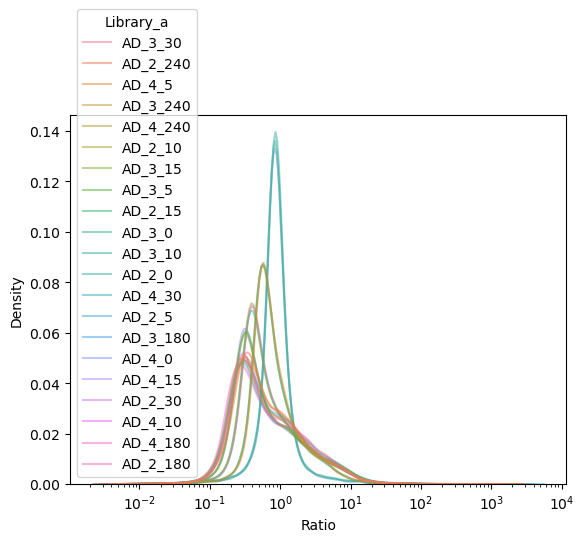

In [10]:
sns.kdeplot(concatenated_df, x='Ratio', hue='Library_a', log_scale=True, alpha=0.5)

/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python

<Axes: xlabel='R_normalized', ylabel='Density'>

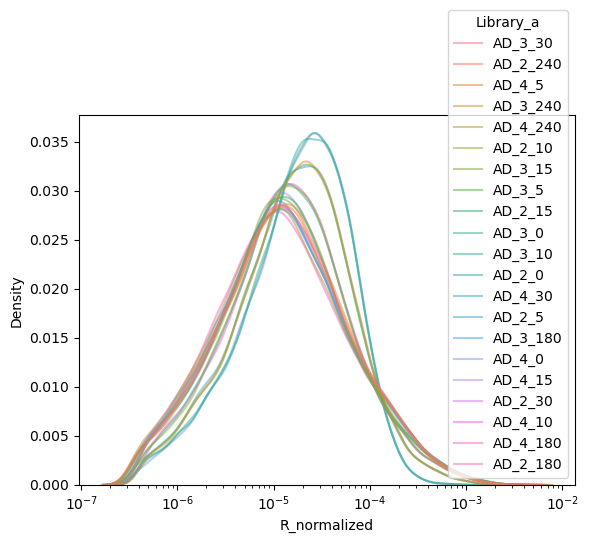

In [11]:
sns.kdeplot(concatenated_df, x='R_normalized', hue='Library_a', log_scale=True, alpha=0.5)

/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/tmp/ipykernel_591347/880861398.py:1: UserWar

<Axes: xlabel='Allreads_r', ylabel='Density'>

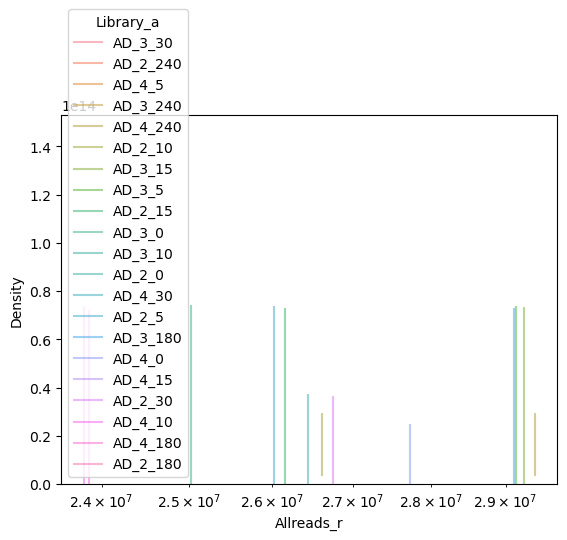

In [12]:
sns.kdeplot(concatenated_df, x='Allreads_r', hue='Library_a', log_scale=True, alpha=0.5)

/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python

<Axes: xlabel='A_normalized', ylabel='Density'>

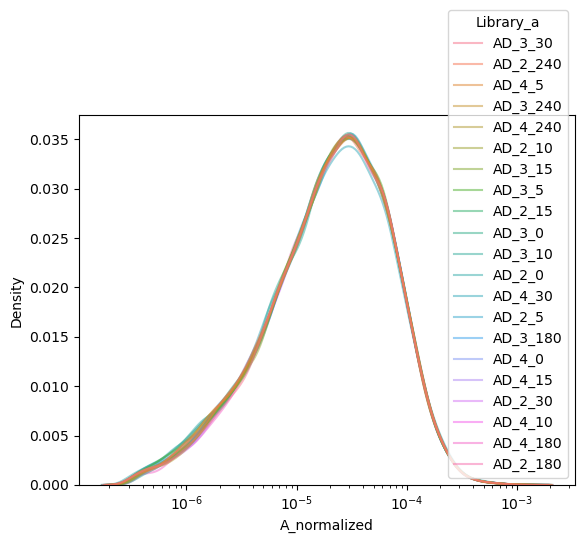

In [13]:
sns.kdeplot(concatenated_df, x='A_normalized', hue='Library_a', log_scale=True, alpha=0.5)

## Look at tiles with best barcode representation 

/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/categorical.py:3544:

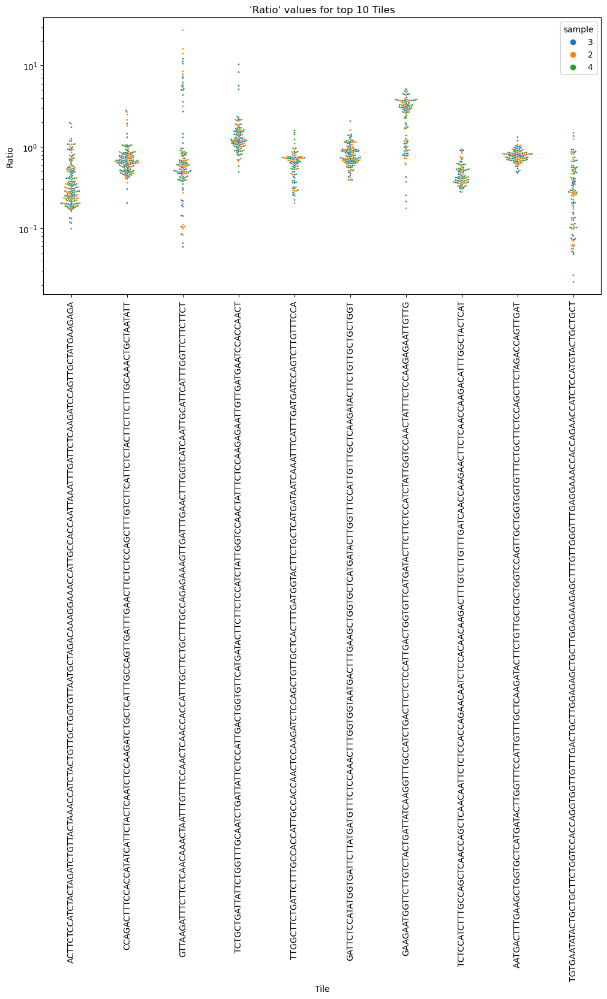

In [8]:
# Step 1: Find the top 10 tiles with the most unique rptr barcodes
top_tiles = concatenated_df.groupby('Tile')['BCs'].nunique().reset_index()
top_tiles_sorted = top_tiles.sort_values('BCs', ascending=False)
top_10_tiles = top_tiles_sorted.head(10)['Tile']

# Step 2: Filter the original dataframe to include only the top 10 tiles
df_filtered = concatenated_df[concatenated_df['Tile'].isin(top_10_tiles)]

# Step 3: Generate the violin plot
plt.figure(figsize=(12, 6))
sns.swarmplot(x='Tile', y='Ratio', hue='sample',
              data=df_filtered, order=top_10_tiles, 
              size=2
             )
# Set the y-axis to a log scale
plt.yscale('log')
# Customize plot
plt.xticks(rotation=90)
plt.title("'Ratio' values for top 10 Tiles")
plt.xlabel("Tile")
plt.ylabel("Ratio")

# Show the plot
plt.tight_layout()
plt.show()


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_1325091/1073685100.py:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


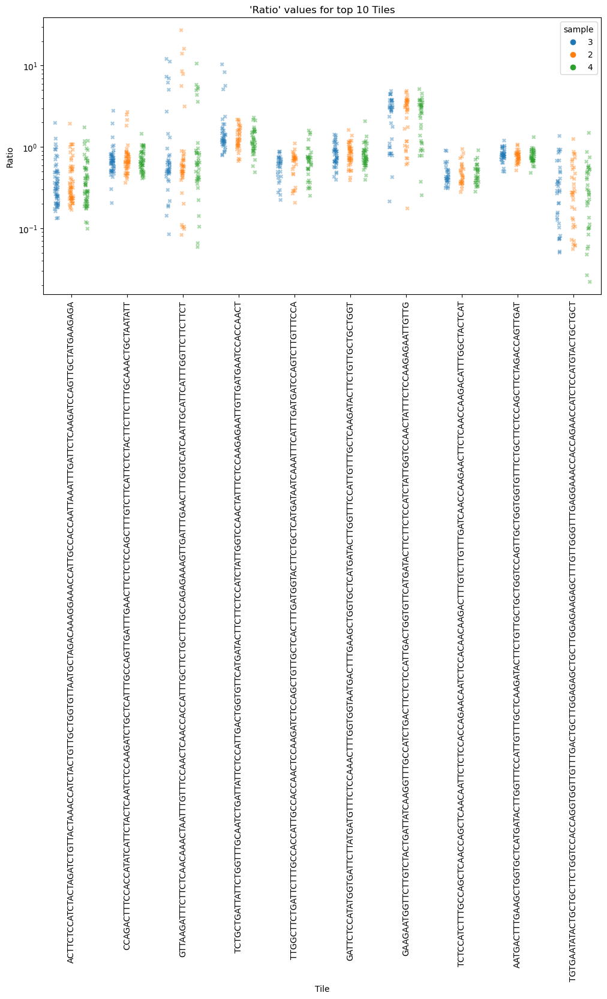

In [9]:
# Step 3: Generate the stripplot
plt.figure(figsize=(12, 6))
sns.stripplot(x='Tile', y='Ratio', hue='sample', dodge=True,
              data=df_filtered, order=top_10_tiles, alpha=0.4, marker="X" )
# Set the y-axis to a log scale
plt.yscale('log')
# Customize plot
plt.xticks(rotation=90)
plt.title("'Ratio' values for top 10 Tiles")
plt.xlabel("Tile")
plt.ylabel("Ratio")

# Show the plot
plt.tight_layout()
plt.show()

/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/categorical.py:3544:

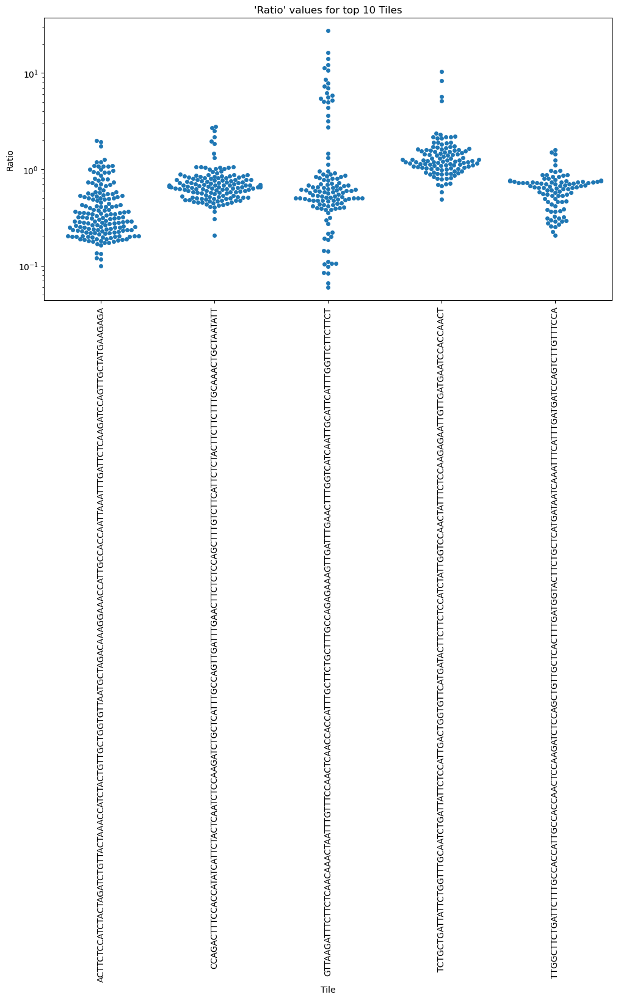

In [10]:
# Step 1: Find the top 5 tiles with the most unique rptr barcodes
top_tiles = concatenated_df.groupby('Tile')['BCs'].nunique().reset_index()
top_tiles_sorted = top_tiles.sort_values('BCs', ascending=False)
top_5_tiles = top_tiles_sorted.head(5)['Tile']

# Step 2: Filter the original dataframe to include only the top 10 tiles
df_filtered = concatenated_df[concatenated_df['Tile'].isin(top_5_tiles)]

# Step 3: Generate the violin plot
plt.figure(figsize=(12, 6))
sns.swarmplot(x='Tile', y='Ratio', data=df_filtered, order=top_5_tiles, 
             size=5
             )
# Set the y-axis to a log scale
plt.yscale('log')
# Customize plot
plt.xticks(rotation=90)
plt.title("'Ratio' values for top 10 Tiles")
plt.xlabel("Tile")
plt.ylabel("Ratio")

# Show the plot
plt.tight_layout()
plt.show()


/tmp/ipykernel_1325091/501438635.py:26: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


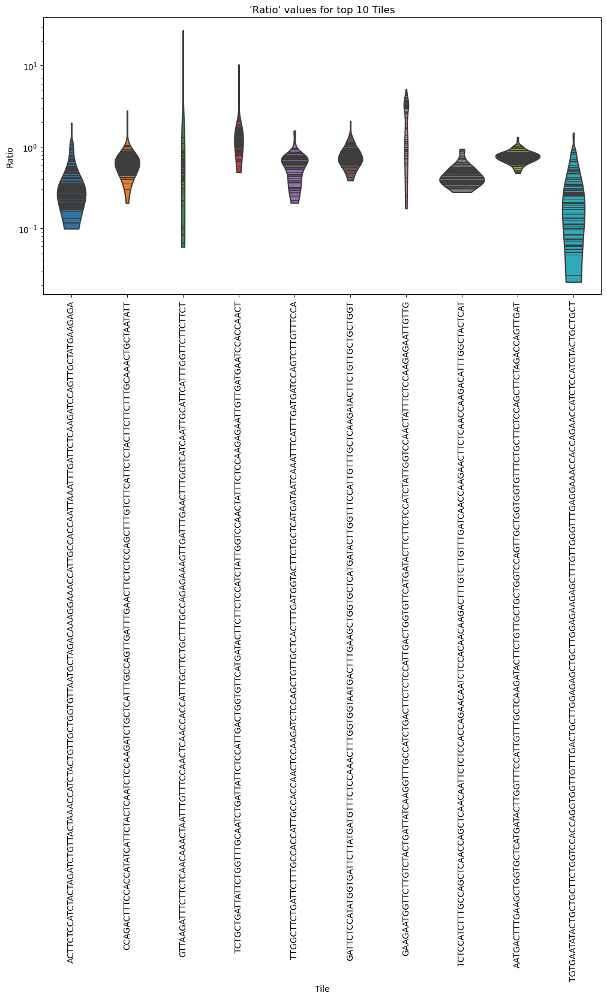

In [11]:
# Step 1: Find the top 10 tiles with the most unique rptr barcodes
top_tiles = concatenated_df.groupby('Tile')['BCs'].nunique().reset_index()
top_tiles_sorted = top_tiles.sort_values('BCs', ascending=False)
top_10_tiles = top_tiles_sorted.head(10)['Tile']

# Step 2: Filter the original dataframe to include only the top 10 tiles
df_filtered = concatenated_df[concatenated_df['Tile'].isin(top_10_tiles)]

# Step 3: Generate the violin plot
plt.figure(figsize=(12, 6))
sns.violinplot(x='Tile', y='Ratio', #hue='sample',
              data=df_filtered, order=top_10_tiles, fill=False,
             # dodge=True, # size=3
             cut=0, inner="stick",bw_adjust=1,
               
              )
# Set the y-axis to a log scale
plt.yscale('log')
# Customize plot
plt.xticks(rotation=90)
plt.title("'Ratio' values for top 10 Tiles")
plt.xlabel("Tile")
plt.ylabel("Ratio")

# Show the plot
plt.tight_layout()
plt.show()


In [12]:
sns.__version__

'0.12.2'

In [13]:
tile10list = top_10_tiles.to_list()

In [15]:
# Define a function to remove outliers using the IQR method for each time group
def remove_outliers(df, group_col, target_col):
    def filter_outliers(group):
        q1 = group[target_col].quantile(0.25) #finding IQR
        q3 = group[target_col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr # establish bounds of IQR
        upper_bound = q3 + 1.5 * iqr
        return group[(group[target_col] >= lower_bound) & (group[target_col] <= upper_bound)] # for a group return only those that are within IQR
    
    return df.groupby(group_col, group_keys=False).apply(filter_outliers) # group by a column, find IQR, return non-outliers

def tile_hillfxn(tile, outliers_removed=True):
    """
    Generate a plot of Ratio vs. Time for a specific tile, showing individual replicates (BCs),
    their mean, and standard deviation. Optionally remove outliers.
    
    Parameters:
    tile (str): The tile to plot.
    outliers_removed (bool): Whether to remove outliers based on IQR.
    """
    # Step 1: Create tile-specific DataFrame
    tiledf = concatenated_df.copy(deep=True)
    tiledf = tiledf[(tiledf['Tile'] == tile) & (tiledf['sample'] == '2')] #only one sample (for now, sample2 (which is sample1 in paper))

    # Remove outliers if required
    if outliers_removed:
        tiledf = remove_outliers(tiledf, group_col='Time', target_col='Ratio') # For each time point, remove outliers

    # Step 2: Calculate mean and standard deviation for each replicate (BCs) across time points
    replicate_means = tiledf.groupby(['Time', 'BCs'])['Ratio'].mean().reset_index() # take mean ratio for each RPTR BC (bc there are some RPTR BCs mapping to different AD BC but same tile)
    # print(replicate_means.head(3))
    """
           Time             BCs     Ratio
    0     0  ATGAACCTTGATTG  0.786766
    1     0  CCAGACCAAAAAAA  0.576973
    2     0  CTCTGACCACCGTA  0.928384
    """
    # Step 3: Calculate overall mean and standard deviation across replicates for each time point
    time_means = tiledf.groupby('Time')['Ratio'].agg(['mean', 'std']).reset_index()
    # print(time_means.head(3))
    """
           Time      mean       std
    0     0  1.031840  0.401848
    1     5  0.585854  0.224947
    2    10  0.370766  0.157119
    """
    
    # Step 4: Plot replicate means (BCs) with separate lines
    plt.figure(figsize=(12, 8))
    sns.lineplot(
        data=replicate_means, 
        x='Time', 
        y='Ratio', 
        hue='BCs', 
        # palette='viridis', 
        alpha=0.6, 
        lw=1.5, 
        legend=True  # Optional: hide legend for individual replicates
    )

    # Step 5: Overlay overall (time) mean with error bars
    plt.errorbar(
        time_means['Time'], 
        time_means['mean'], 
        yerr=time_means['std'], 
        fmt='o-', 
        capsize=5, 
        capthick=2, 
        color='black', 
        label='Overall Mean ± Std Dev', 
        lw=2, 
        alpha=0.7
    )

    # Step 6: Customize the plot
    plt.xlabel('Time')
    plt.ylabel('Ratio')
    plt.title(f'Ratio Over Time: Tile {tile} Replicates and Overall Mean')
    plt.legend(title='Replicates', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.3)

    # Show the plot / save
    plt.tight_layout()
    plt.show()


    # # Step 7: Plot BC mean ratio distribution to make sure IQR method for outliers is appropriate 
    """
    Distribution is non-parametric (skewed to the left, see lab notebook November 19, 2024), so we will keep the IQR method for calculating outliers
    """
    # plt.figure(figsize=(12, 8))
    # sns.histplot(
    #     data=replicate_means, 
    #     x='Ratio', 
    #     hue='BCs', 
    #     # palette='viridis', 
    #     alpha=0.6, 
    #     lw=1.5, 
    #     legend=True)  # Optional: hide legend for individual replicates
    #         # Show the plot
    # plt.tight_layout()
    # plt.show()


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

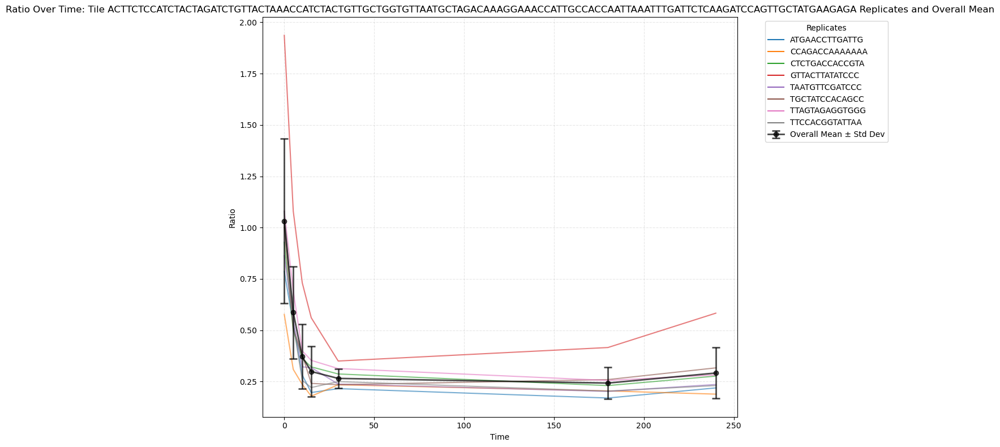

In [15]:
tile_hillfxn(tile10list[0], False)

### The above distribution is nonparametric, so I'm gonna stick with the IQR method for eliminating outliers

/tmp/ipykernel_2949411/3311403108.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby(group_col, group_keys=False).apply(filter_outliers) # group by a column, find IQR, return non-outliers
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN bef

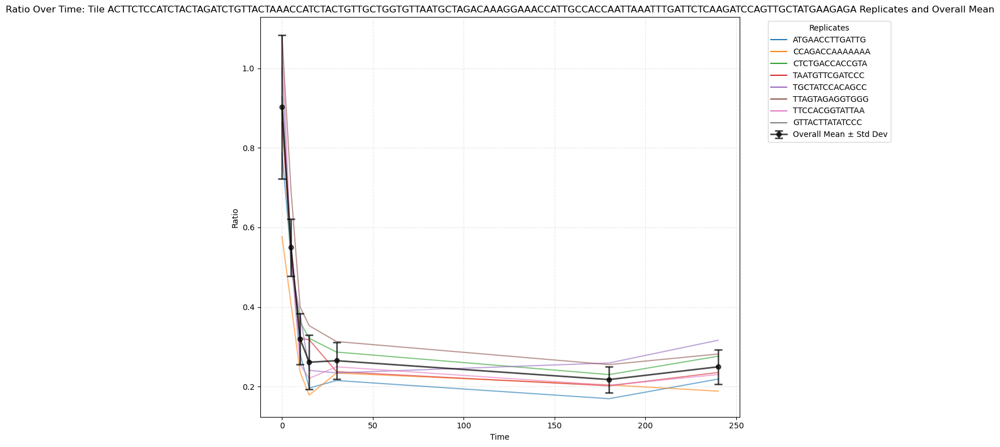

In [16]:
tile_hillfxn(tile10list[0])

In [16]:
def replicate_hillfxn(tile, outliers_removed=True):
    # create tile-specific df
    tiledf = concatenated_df.copy(deep=True)
    tiledf = tiledf[tiledf['Tile']==tile]
    # tiledf['Time'] = tiledf['Library_a'].str.split('_').str[-1]
    # tiledf['Time'] = pd.to_numeric(tiledf['Time'])
    # tiledf['sample'] = tiledf['Library_a'].str.split('_').str[-2]

    # remove outliers of each time group
    if outliers_removed:
        tiledf = remove_outliers(tiledf, group_col='Time', target_col='Ratio')

    # Calculate the mean ratio for each Time point and Library_a (ratio gets plotted as line graphs)
    sample_means = tiledf.groupby(['Time', 'sample'])['Ratio'].mean().reset_index()
    print(sample_means.head(3))
    """
           Time sample     Ratio
    0     0      2  0.902577
    1     0      3  0.887823
    2     0      4  0.848318
    """

    # Calculate mean and standard deviation (gets plotted as mean/error bars)
    time_means = sample_means.groupby('Time')['Ratio'].agg(['mean', 'std']).reset_index()
    print(time_means.head(3))
    """
           Time      mean       std
    0     0  0.879572  0.224197
    1     5  0.520112  0.115852
    2    10  0.343033  0.069198
    """
    
    # Plot individual sample lines
    plt.figure(figsize=(12, 8))
    sns.lineplot(data=sample_means, x='Time', y='Ratio', hue='sample', 
                 palette='viridis', 
                 alpha=0.85, # Use lighter lines for samples
                 lw=1.5, legend=True)  
    # Step 3: Overlay the overall mean with error bars
    plt.errorbar(time_means['Time'], time_means['mean'], yerr=time_means['std'],
                 fmt='o-', capsize=5, capthick=2, color='red', label='Overall Mean ± Std Dev', lw=2, alpha=0.5)
    
    # Customize plot
    plt.xlabel('Time')
    plt.ylabel('Ratio')
    plt.title('Ratio Over Time: Individual Samples and Overall Mean')
    plt.legend(title='Sample', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.3)  # Optional: Faint grid
    
    # Show plot
    plt.tight_layout()
    plt.show()

   Time sample     Ratio
0     0      2  0.902577
1     0      3  0.887823
2     0      4  0.848318
   Time      mean       std
0     0  0.879572  0.028055
1     5  0.520112  0.040508
2    10  0.343033  0.024019


/tmp/ipykernel_2949411/3311403108.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby(group_col, group_keys=False).apply(filter_outliers) # group by a column, find IQR, return non-outliers
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN bef

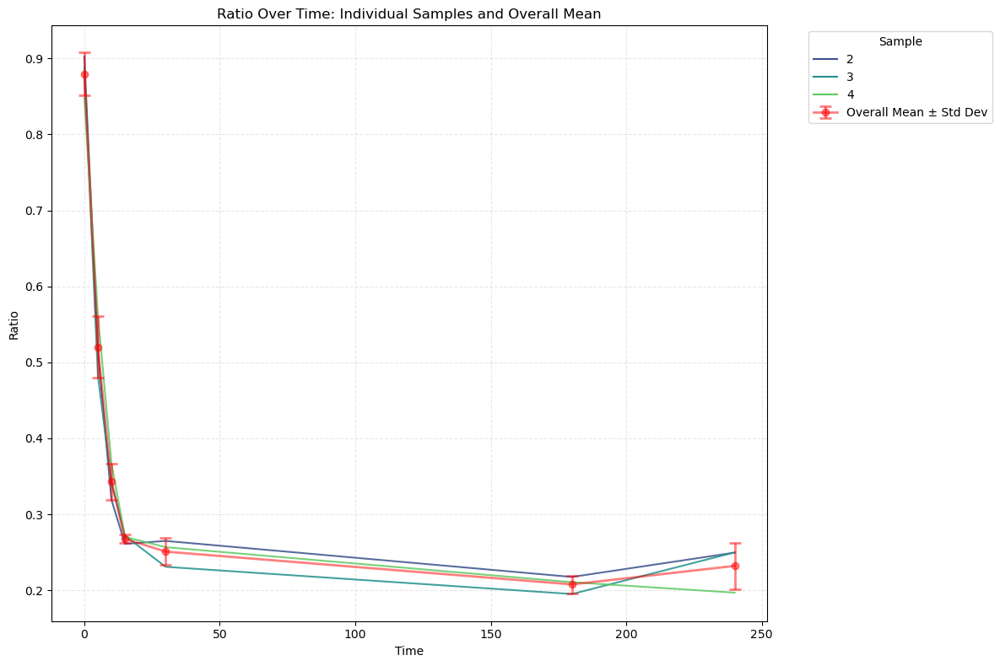

In [18]:
replicate_hillfxn(tile10list[0])

In [17]:
# read in facs csv with activity data and control designation (EC did by hand in excel)
facs_f='Gcn4OrthologData_ToShare_20230414_EC.csv'
facsdf = pd.read_csv(facs_f, usecols=['Name','ArrayDNA','is_control',]).dropna()

# inner join the df's 
intersectiondf = pd.merge(concatenated_df, facsdf,
                   left_on = 'Tile', right_on = 'ArrayDNA',
                   how= 'inner')
intersectiondf = intersectiondf.drop(columns=['ArrayDNA', ])
intersectiondf

,BCs,count_r,Allreads_r,Tile-AD,count_a,Library_a,Allreads_a,R_normalized,A_normalized,Ratio,Tile,AD,Time,sample,Name,is_control
0,CATTCATAAAGAAC,67185,23971211,TTCTTCTCTTCTTCTGTTGATTCTACTCCAATGTTTGATTTGGATG...,11778,AD_3_30,32851735,2.802737e-03,3.585199e-04,7.817522,TTCTTCTCTTCTTCTGTTGATTCTACTCCAATGTTTGATTTGGATG...,CCCCACCGGCC,30,3,Karf_KAFR0L00510_71,experimental
1,GGAGGGCCAACGCA,62664,23971211,TCTCCAGATATTGATGCTTCTCCATTTATTAATGATTCATTTGAAA...,11464,AD_3_30,32851735,2.614136e-03,3.489618e-04,7.491181,TCTCCAGATATTGATGCTTCTCCATTTATTAATGATTCATTTGAAA...,TTCCTCACAGG,30,3,Dothideomycetes_jgi|Epini1|455912|estExt_fgene...,experimental
2,TAGTCAGACGCAAA,57218,23971211,TTTACTGATTTGTCTACTCCATCATTTGATTCTCCAGGTTACTTCT...,17222,AD_3_30,32851735,2.386947e-03,5.242341e-04,4.553207,TTTACTGATTTGTCTACTCCATCATTTGATTCTCCAGGTTACTTCT...,GTTATGTGACA,30,3,Eurotiomycetes_jgi|Aspwest1|288254|MIX3379_623...,experimental
3,TATCCCATTCCGAC,47006,23971211,CCATCTATCTTTGATTCTCCAGATGTTGCTGAATCATTTGAAACTT...,8877,AD_3_30,32851735,1.960936e-03,2.702140e-04,7.256971,CCATCTATCTTTGATTCTCCAGATGTTGCTGAATCATTTGAAACTT...,TGTGATAAACT,30,3,Xylonomycetes_jgi|Xylhe1|264767|gm1.473_g_1081,experimental
4,TGTACTCATTGGAG,45504,23971211,GCTCCATCTAATTTGGACTTTGACTTTACTTTGCCACAAACTGTTA...,13910,AD_3_30,32851735,1.898277e-03,4.234175e-04,4.483228,GCTCCATCTAATTTGGACTTTGACTTTACTTTGCCACAAACTGTTA...,TATCTTTTTCG,30,3,Skud_5.91_61,experimental
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
310641,TGGTTAACCGTTTG,10,29404000,CCAGGTGGTGAATCTTTGCAAAGGAAGAGATCTTCTGCTACTAATT...,41,AD_2_180,27927346,3.400898e-07,1.468095e-06,0.231654,CCAGGTGGTGAATCTTTGCAAAGGAAGAGATCTTCTGCTACTAATT...,GCGGATGACTG,180,2,Dothideomycetes_jgi|Ternu1|257952|gw1.42.157.1...,experimental
310642,AACTGTTCTAAGGG,10,29404000,GTTGAATCTGATGGTCATGTTTCTGATAGATCTGGTTCTAGAACTG...,47,AD_2_180,27927346,3.400898e-07,1.682938e-06,0.202081,GTTGAATCTGATGGTCATGTTTCTGATAGATCTGGTTCTAGAACTG...,ACAGCATTGAG,180,2,Eurotiomycetes_jgi|Theau1|5329|gm1.5329_g_201,experimental
310643,GTCGAGGATGATGA,10,29404000,ACTTGGGAACCATTGTTTGGTACTGGTGAAGATGCTAATGTTGAAT...,26,AD_2_180,27927346,3.400898e-07,9.309871e-07,0.365300,ACTTGGGAACCATTGTTTGGTACTGGTGAAGATGCTAATGTTGAAT...,CGTCTTTCACA,180,2,Zyro_ZYRO0D09174g_46,experimental
310644,ACTTATTTCACCAT,10,29404000,GGTCAGAATAGAAGACATTCTTCTCATTTGTCTTCTCAACCAGTTC...,27,AD_2_180,27927346,3.400898e-07,9.667943e-07,0.351771,GGTCAGAATAGAAGACATTCTTCTCATTTGTCTTCTCAACCAGTTC...,ACCCTGGTGGT,180,2,Leotiomycetes_jgi|Oidma1|28308|fgenesh1_pg.6_#...,experimental


In [27]:
# Combine the two hill functions I wrote into a single function (side by side plots)

# Define a function to remove outliers using the IQR method for each time group
def remove_outliers(df, group_col, target_col):
    def filter_outliers(group):
        q1 = group[target_col].quantile(0.25) #finding IQR
        q3 = group[target_col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr # establish bounds of IQR
        upper_bound = q3 + 1.5 * iqr
        return group[(group[target_col] >= lower_bound) & (group[target_col] <= upper_bound)] # for a group return only those that are within IQR
    # # Apply function and reindex the grouping columns explicitly
    # filtered = (
    #     df.groupby(group_col, group_keys=False)
    #     .apply(filter_outliers, include_groups=True)
    #     .reset_index(drop=True)  # Reset index to avoid issues with duplicate group indices
    # )
    # return filtered
    return df.groupby(group_col, group_keys=False)[['Tile','sample','Name', 'Ratio', 'Time', 'BCs']].apply(filter_outliers) # group by a column, find IQR, return non-outliers


def tile_and_replicate_hillfxn(tile, outliers_removed=True):
    """
    Generate subplots for:
    1. Ratio vs. Time for a single sample, showing individual replicates (BCs) with their mean and standard deviation.
    2. Ratio vs. Time for multiple samples, showing individual sample lines with overall mean and standard deviation.
    
    Parameters:
    tile (str): The tile to plot.
    outliers_removed (bool): Whether to remove outliers (based on IQR).
    """
    # Step 1: Create a tile-specific DataFrame for single and multiple samples
    tiledf = intersectiondf.copy(deep=True)
    single_sample_df = tiledf[(tiledf['Tile'] == tile) & (tiledf['sample'] == '2')]
    tiledf = intersectiondf.copy(deep=True)
    all_samples_df = tiledf[tiledf['Tile'] == tile]
    tile_name = set(all_samples_df['Name'].to_list())
    tile_name = next(iter(tile_name))
    print(tile_name)

    # Step 2: Remove outliers if required
    if outliers_removed:
        single_sample_df = remove_outliers(single_sample_df, group_col='Time', target_col='Ratio')
        # print(single_sample_df.head(3))
        all_samples_df = remove_outliers(all_samples_df, group_col='Time', target_col='Ratio')

    # Step 3: Calculate metrics for single sample
    replicate_means = single_sample_df.groupby(['Time', 'BCs'])['Ratio'].mean().reset_index()
    """
           Time             BCs     Ratio
    0     0  ATGAACCTTGATTG  0.786766
    1     0  CCAGACCAAAAAAA  0.576973
    2     0  CTCTGACCACCGTA  0.928384
    """
    single_time_means = single_sample_df.groupby('Time')['Ratio'].agg(['mean', 'std']).reset_index()
    """
           Time      mean       std
    0     0  1.031840  0.401848
    1     5  0.585854  0.224947
    2    10  0.370766  0.157119
    """

    # Step 4: Calculate metrics for multiple samples
    sample_means = all_samples_df.groupby(['Time', 'sample'])['Ratio'].mean().reset_index()
    """
           Time sample     Ratio
    0     0      2  0.902577
    1     0      3  0.887823
    2     0      4  0.848318
    """
    all_time_means = sample_means.groupby('Time')['Ratio'].agg(['mean', 'std']).reset_index()
    """
           Time      mean       std
    0     0  0.879572  0.224197
    1     5  0.520112  0.115852
    2    10  0.343033  0.069198
    """
    # Step 5: Set up side-by-side subplots
    fig, axes = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
    fig.suptitle(f'Tile {tile_name}: Ratio vs. Time', fontsize=16, fontweight='bold')  # Overall title
    
    # Plot 1: Single sample replicates
    sns.lineplot(
        data=replicate_means, 
        x='Time', 
        y='Ratio', 
        hue='BCs', 
        ax=axes[0], 
        alpha=0.6, 
        lw=1.5
    )
    axes[0].errorbar(
        single_time_means['Time'], 
        single_time_means['mean'], 
        yerr=single_time_means['std'], 
        fmt='o-', 
        capsize=5, 
        capthick=2, 
        color='black', 
        label='Overall Mean ± Std Dev', 
        lw=2, 
        alpha=0.7
    )
    axes[0].set_title('Single Sample (Sample 2)')
    axes[0].set_ylabel('Ratio (RPTR norm.reads/AD norm.reads)')
    axes[0].set_xlabel('Time (min)')
    axes[0].legend(title='Replicates', bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[0].grid(True, linestyle='--', alpha=0.3)

    # Plot 2: Multiple samples
    sns.lineplot(
        data=sample_means, 
        x='Time', 
        y='Ratio', 
        hue='sample', 
        ax=axes[1], 
        palette='viridis', 
        alpha=0.85, 
        lw=1.5
    )
    axes[1].errorbar(
        all_time_means['Time'], 
        all_time_means['mean'], 
        yerr=all_time_means['std'], 
        fmt='o-', 
        capsize=5, 
        capthick=2, 
        color='red', 
        label='Overall Mean ± Std Dev', 
        lw=2, 
        alpha=0.5
    )
    axes[1].set_title('All Samples')
    axes[1].set_ylabel('Ratio (RPTR norm.reads/AD norm.reads)')
    axes[1].set_xlabel('Time (min)')
    axes[1].legend(title='Sample', bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[1].grid(True, linestyle='--', alpha=0.3)

    # Adjust layout and show plot
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(f'{tile_name}_raw.jpg')
    plt.show()
    




Eurotiomycetes_jgi|Asptam1|289766|fgenesh1_pm.66_#_40_426


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

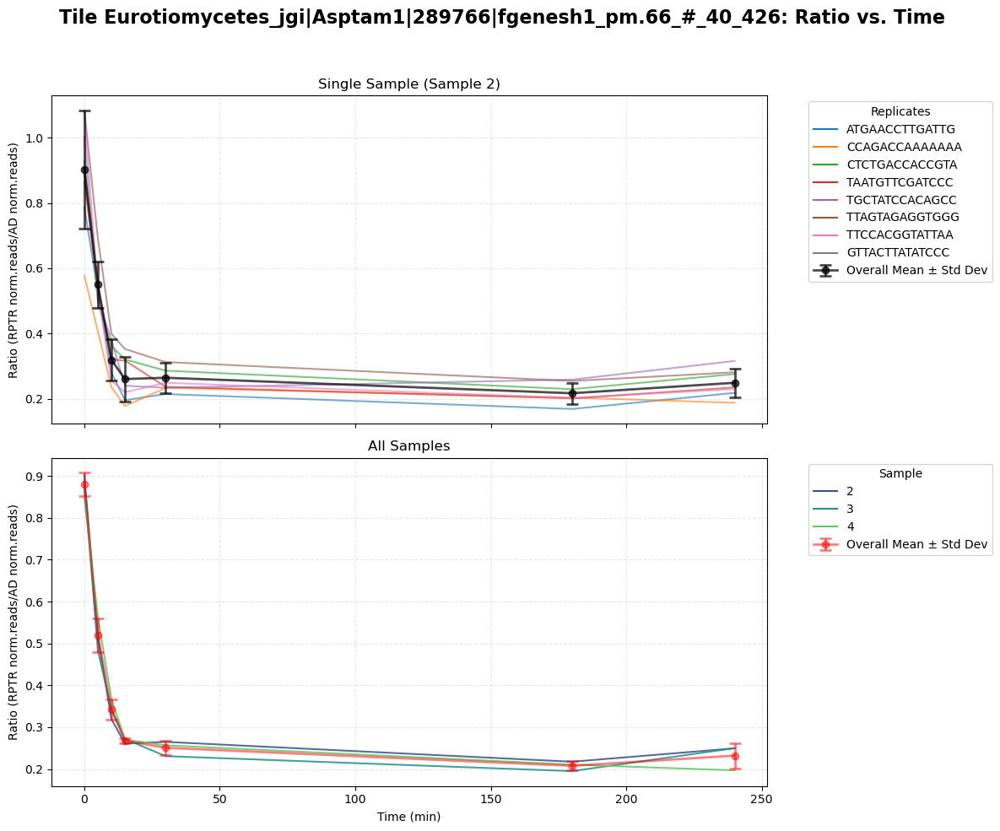

In [29]:
tile10list = top_10_tiles.to_list()
tile_and_replicate_hillfxn(tile10list[0])

{'Eurotiomycetes_jgi|Asptam1|289766|fgenesh1_pm.66_#_40_426'}


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

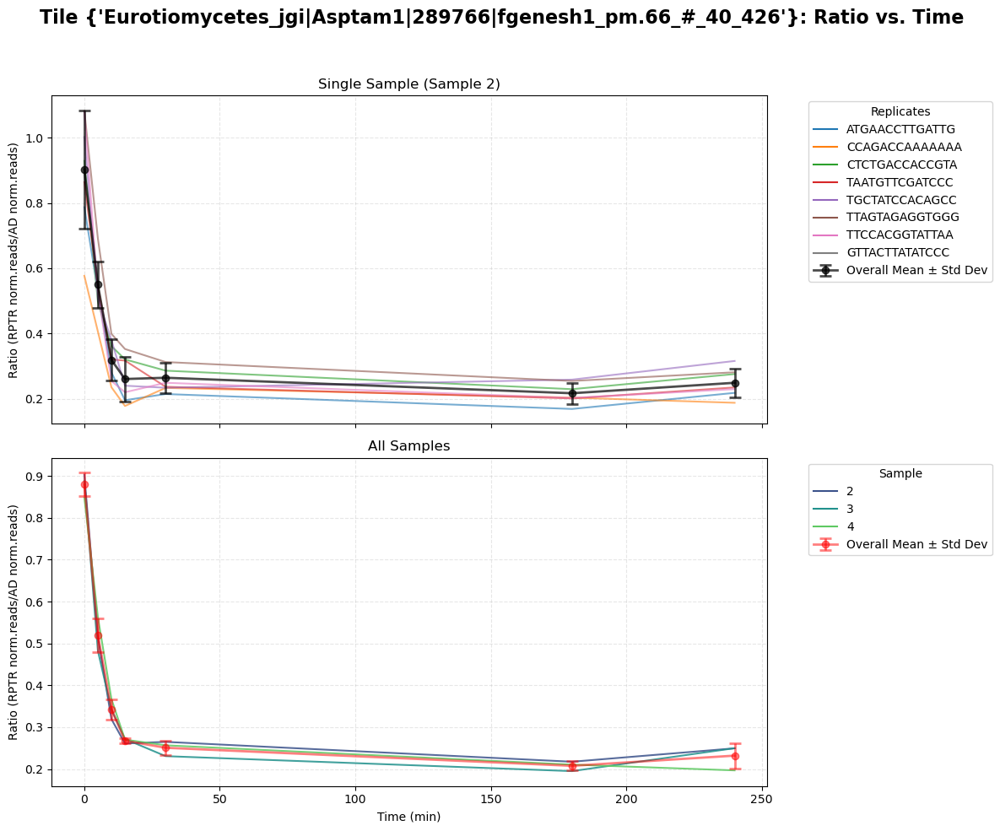

{'Sordariomycetes_jgi|Daces1|438495|e_gw1.5.1304.1_11'}


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

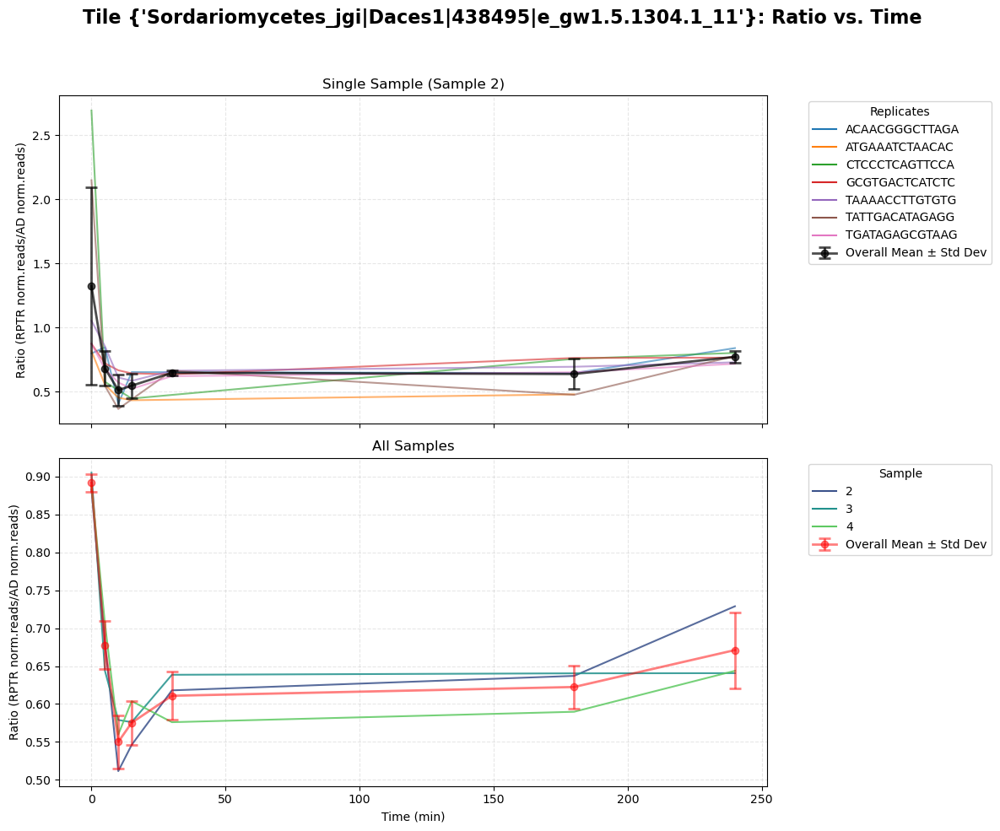

{'Sordariomycetes_jgi|ThoPMI491_1|653909|e_gw1.34.424.1_1'}


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

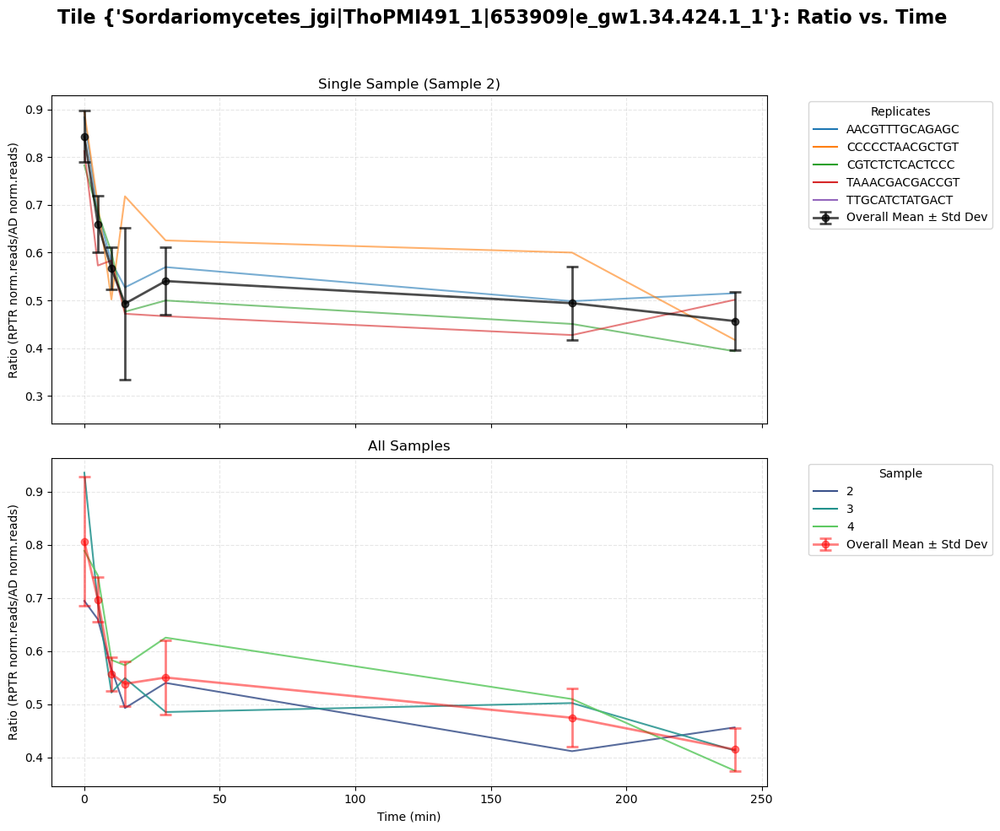

{'Pezizomycetes_jgi|Chove1|1841465|estExt_fgenesh1_pg.C_140116_316'}


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

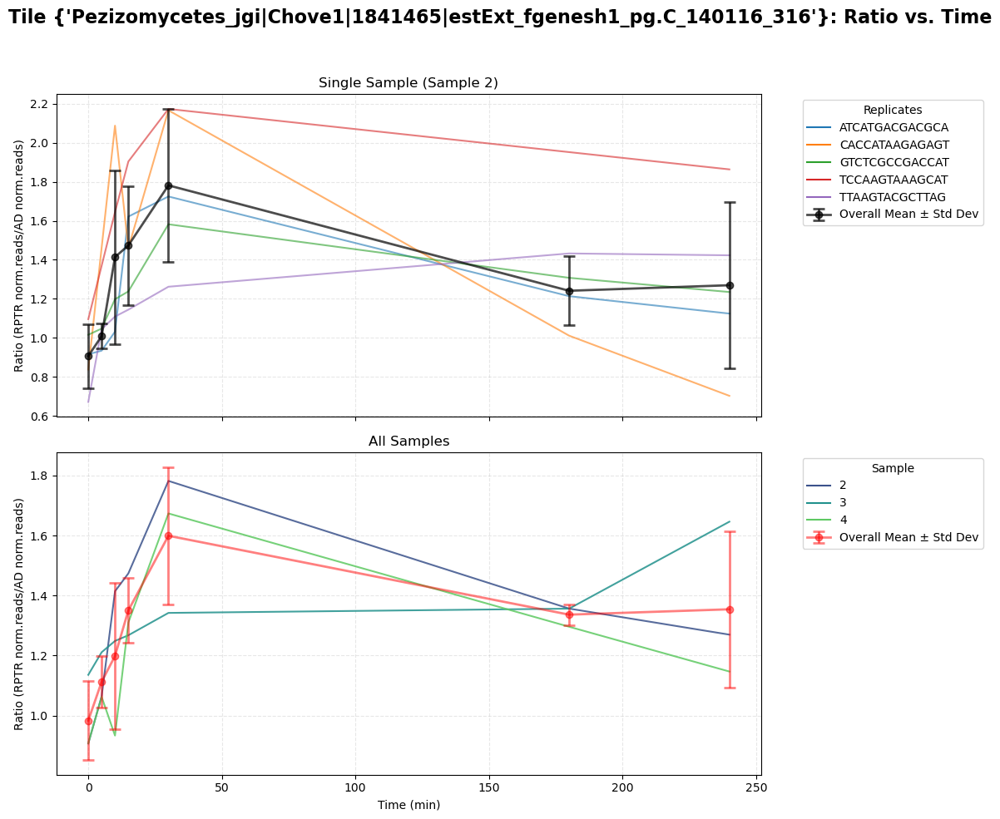

{'Pezizomycetes_jgi|Tubbor1|1111843|estExt_fgenesh1_pg.C_6370002_46'}


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

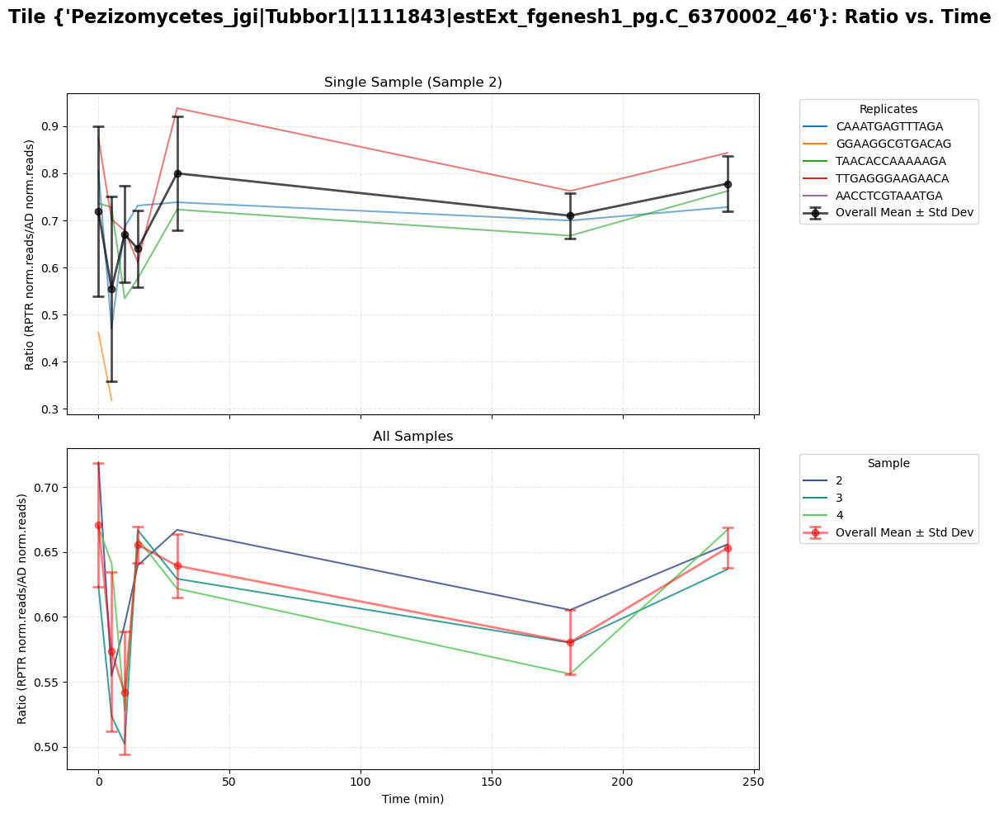

{'Sordariomycetes_jgi|OphPMI507_1|294364|gw1.10.112.1_71'}


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

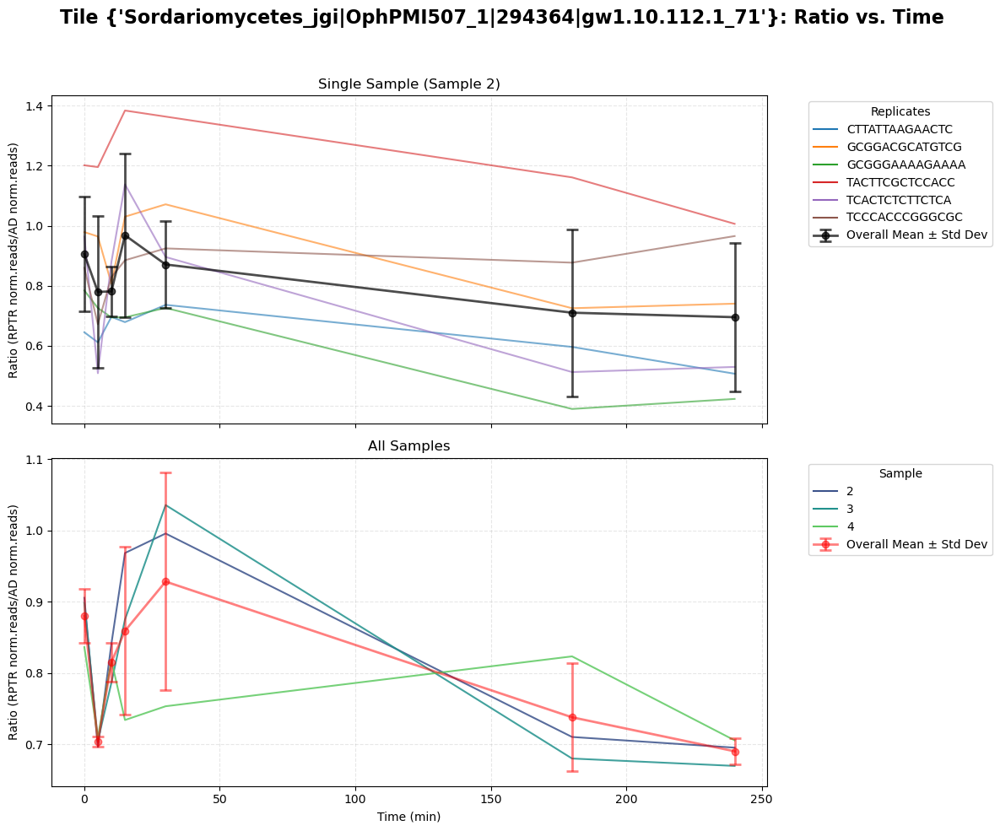

{'Pezizomycetes_jgi|Tubbor1|1011776|e_gw1.637.10.1_11'}


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

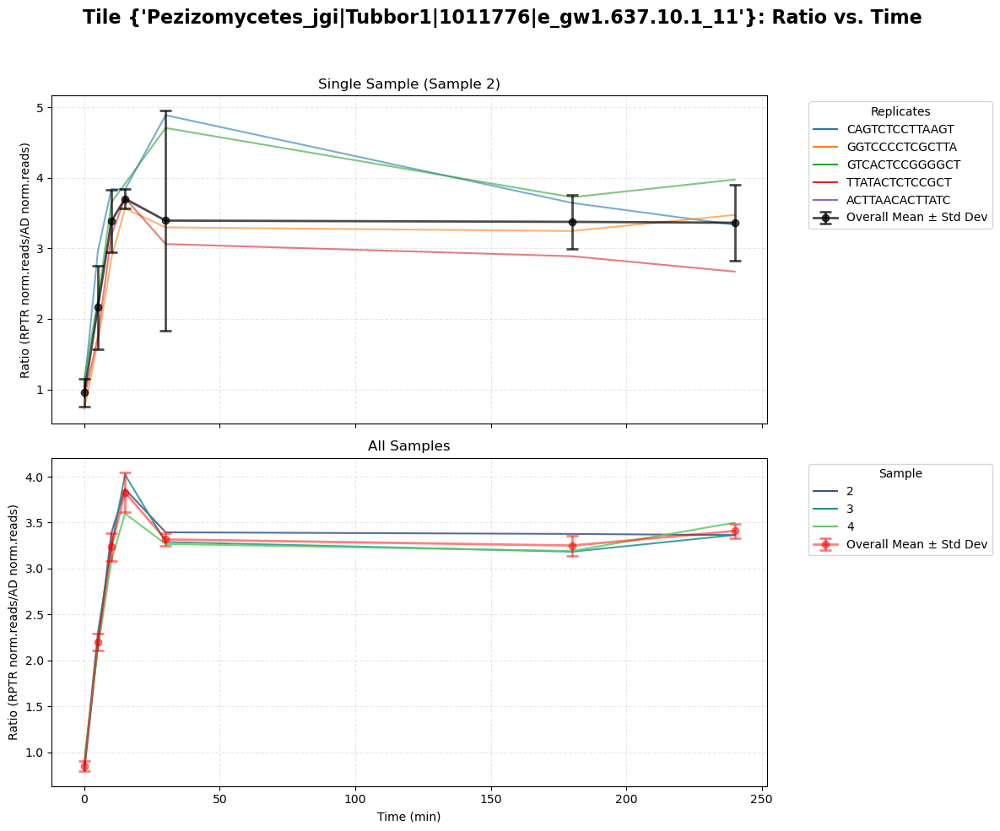

{'Sordariomycetes_jgi|Colac2|590938|e_gw1.162.24.1_41'}


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

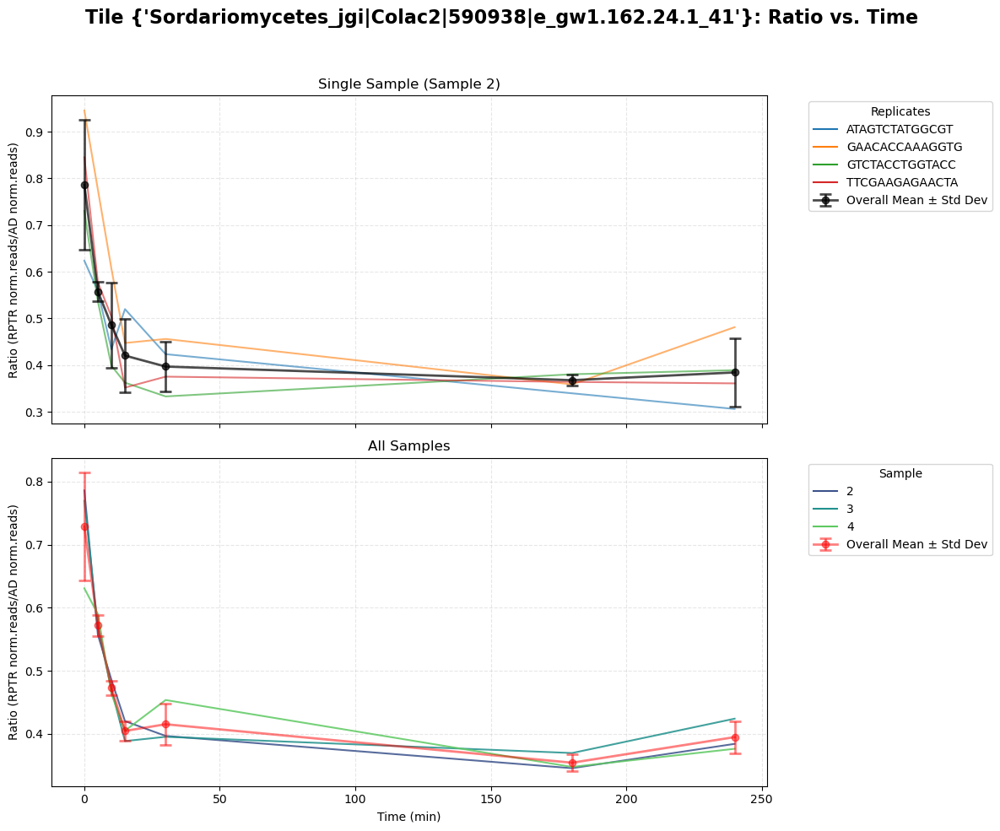

{'Sordariomycetes_jgi|OphPMI507_1|434063|gm1.8796_g_926'}


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

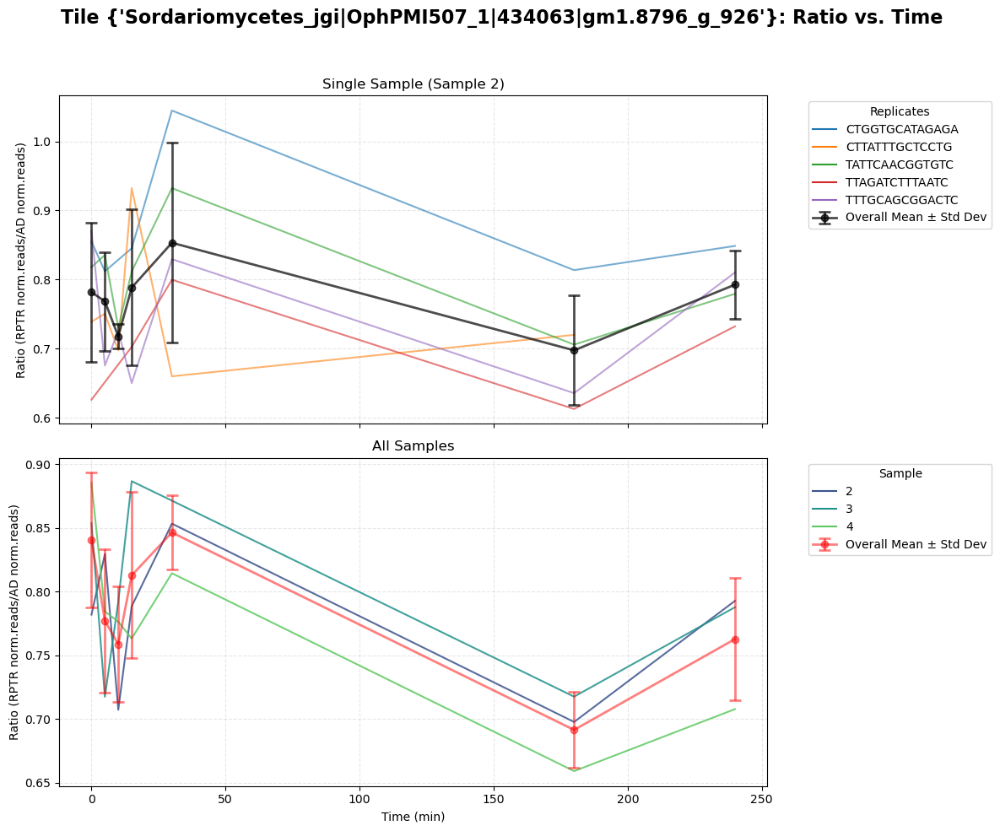

{'Sordariomycetes_jgi|Trici4|1160733|gm1.5794_g_31'}


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

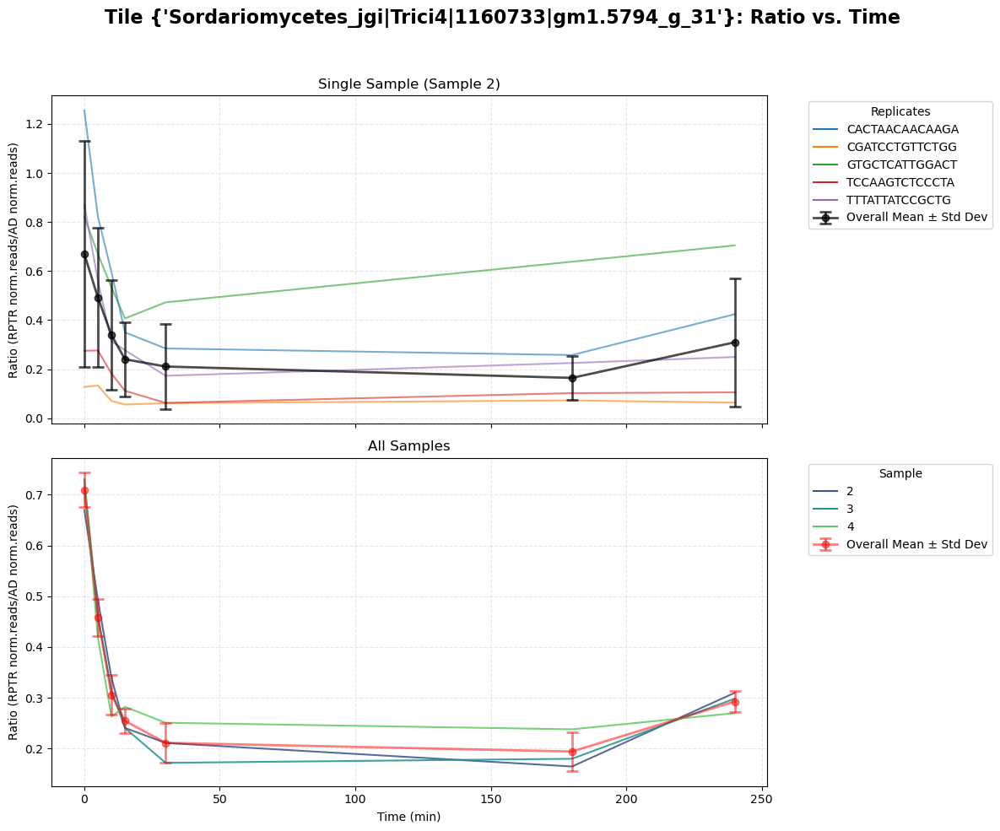

In [22]:
for t in top_10_tiles.to_list():
    tile_and_replicate_hillfxn(t)

### Woah. What about Controls ?

In [25]:
# read in facs csv with activity data and control designation (EC did by hand in excel)
facs_f='Gcn4OrthologData_ToShare_20230414_EC.csv'
facsdf = pd.read_csv(facs_f, usecols=['Name','ArrayDNA','is_control',
                              'Activity_SCglucose', 'Activity_SCglucose_GFP1', 'Activity_SCglucose_GFP2']).dropna()
facsdf['average_gfp'] = facsdf[['Activity_SCglucose_GFP1', 'Activity_SCglucose_GFP2']].mean(axis=1)

# inner join the df's 
intersectiondf_ctrl = pd.merge(concatenated_df, facsdf[facsdf['is_control']!='experimental'] ,
                   left_on = 'Tile', right_on = 'ArrayDNA',
                   how= 'inner')
intersectiondf_ctrl = intersectiondf_ctrl.drop(columns=['ArrayDNA', 'Activity_SCglucose_GFP1', 'Activity_SCglucose_GFP2'])
intersectiondf_ctrl

,BCs,count_r,Allreads_r,Tile-AD,count_a,Library_a,Allreads_a,R_normalized,A_normalized,Ratio,Tile,AD,Time,sample,Name,is_control,Activity_SCglucose,average_gfp
0,TCTGAGTCCAAATC,27807,23971211,ACTGACTTTATTGATGAAGAAGTCTTGATGTCTTTGGTTATTGAAA...,3137,AD_3_30,32851735,0.001160,0.000095,12.148089,ACTGACTTTATTGATGAAGAAGTCTTGATGTCTTTGGTTATTGAAA...,ACCTCCGTGTG,30,3,CITED2_0,high,262011.59690,888.784794
1,TGTACCAAGGGAAG,19149,23971211,GATTCTCCAGGTCCAGGATTTACTCCACATGATTCTGCTCCATATG...,2358,AD_3_30,32851735,0.000799,0.000072,11.129371,GATTCTCCAGGTCCAGGATTTACTCCACATGATTCTGCTCCATATG...,GAAGTATTGTA,30,3,VP16C_L2I_0,high,242998.32210,1882.338381
2,GCAAGGTCGATAAC,19138,23971211,AATACTGATTCTACTCATATGTTTGAATATTGGGCTTTGGAAGATA...,1686,AD_3_30,32851735,0.000798,0.000051,15.556336,AATACTGATTCTACTCATATGTTTGAATATTGGGCTTTGGAAGATA...,CGCATATCCAT,30,3,Gnc4Lib_Disorder_HIGH_0,high,260508.73720,679.652416
3,CGGCAATCTGACCG,16745,23971211,ACTGACTTTATTGATGAAGAAGTCTTGATGTCTTTGGTTATTGAAA...,1819,AD_3_30,32851735,0.000699,0.000055,12.615974,ACTGACTTTATTGATGAAGAAGTCTTGATGTCTTTGGTTATTGAAA...,ATTCGTGCGAG,30,3,CITED2_0,high,262011.59690,888.784794
4,AAAACTTAGTGGAT,16044,23971211,TTGACTGCTTTGACTTCTCCATCTTTGTTTGATGGTTCTCCAGACT...,2326,AD_3_30,32851735,0.000669,0.000071,9.453035,TTGACTGCTTTGACTTCTCCATCTTTGTTTGATGGTTCTCCAGACT...,AAAACAAGCAC,30,3,Gnc4Lib_ChopOrthologs_HIGH_0,high,260539.49730,1526.813030
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1551,ATTGTCCTCCGTCA,126,29404000,GATTCTCCAGGTCCAGGTGCTACTCCACATGATTCTGCTCCATATG...,179,AD_2_180,27927346,0.000004,0.000006,0.668561,GATTCTCCAGGTCCAGGTGCTACTCCACATGATTCTGCTCCATATG...,CCCTAGCCGGT,180,2,VP16C_F2A_0,low,26659.66132,2497.095826
1552,CTGAGCCTGTCGCT,111,29404000,TCTACTGATTCTACTCCAATGTTTGAATATCAGAATTTGGAGAATA...,34,AD_2_180,27927346,0.000004,0.000001,3.100754,TCTACTGATTCTACTCCAATGTTTGAATATCAGAATTTGGAGAATA...,CCTAGAGGCGC,180,2,Gnc4Lib_Charge_HIGH_0,mid,113052.30510,1617.889619
1553,AAAAGAATGTGGCA,104,29404000,TATGCTATTCCAGAGAATGAAGCTGCTGATGAAGATACTATGAACT...,112,AD_2_180,27927346,0.000004,0.000004,0.881939,TATGCTATTCCAGAGAATGAAGCTGCTGATGAAGATACTATGAACT...,TAGATAATAAT,180,2,Rap1_L2A_0,low,33401.46280,2143.882744
1554,TCCTCTACGGCTTG,69,29404000,CCACCAACTGATGTTTCTTTGGGTGATGAATTGCATTTGGATGGTG...,97,AD_2_180,27927346,0.000002,0.000003,0.675617,CCACCAACTGATGTTTCTTTGGGTGATGAATTGCATTTGGATGGTG...,CCCTGCCGGTC,180,2,VP16N_F442A_0,low,32724.71918,2680.925505


TTGACTGCTTTGACTTCTCCATCTTTGTTTGATGGTTCTCCAGACTTTGATACATTTGATATTTCTCCAAACTTTGGTCATTCTGATTTGGAGAATCCAGATACTTGGTTCTCTTTGTTT
30
Gnc4Lib_ChopOrthologs_HIGH_0


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

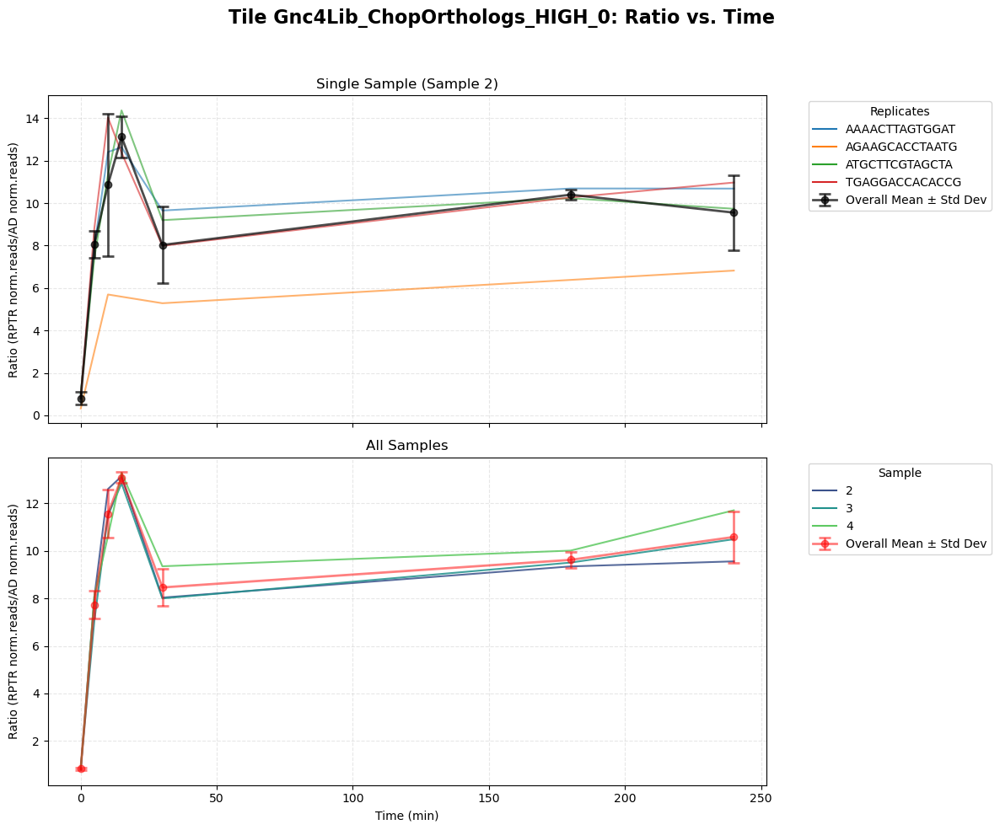

TCTACTGATTCTACTCCAATGTTTGAATATGAGAATTTGCAGAATAATTCTAAAGAATGGACTTCTTTGTTTGATAATAATATTCCAGTTACTACTAATAATGTTTCTTTGGCTAATAAA
30
Gnc4Lib_Charge_LOW_0


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

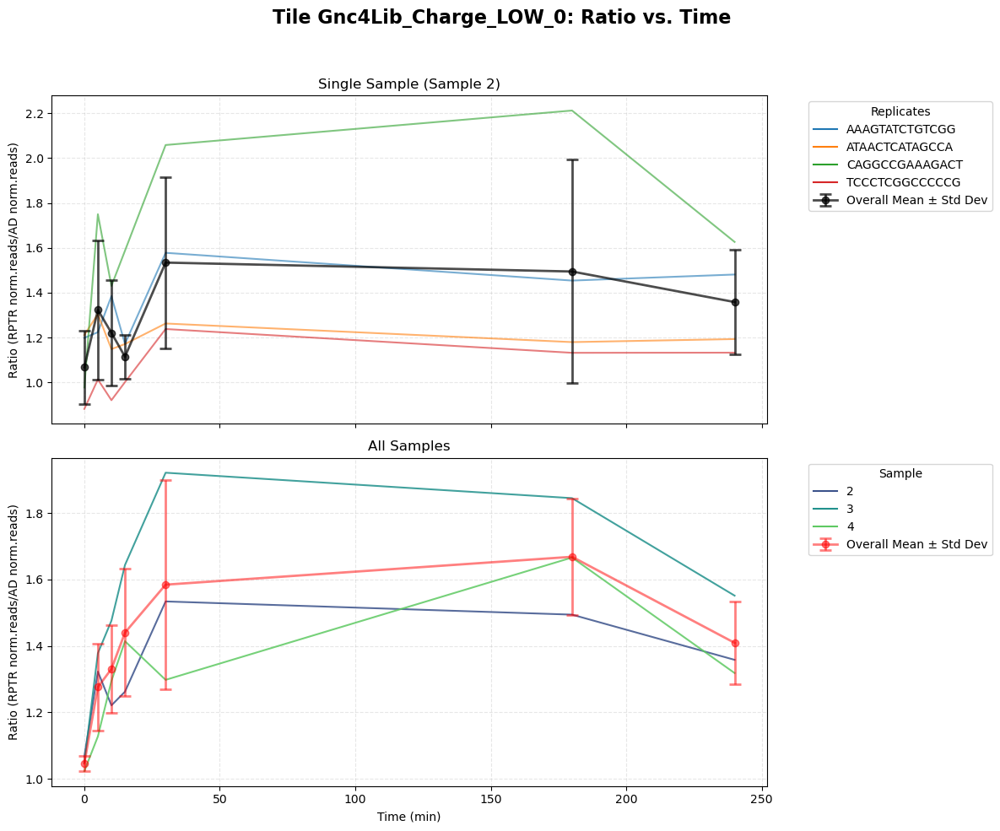

CCACCAACTGATGTTTCTGCTGGTGATGAAGCTCATGCTGATGGTGAAGATGTTGCTATGGCTCATGCTGATGCTGCTGATGATGCTGATGCTGATATGGCTGGTGATGGTGATTCTCCA
30
VP16N_L2A_0


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

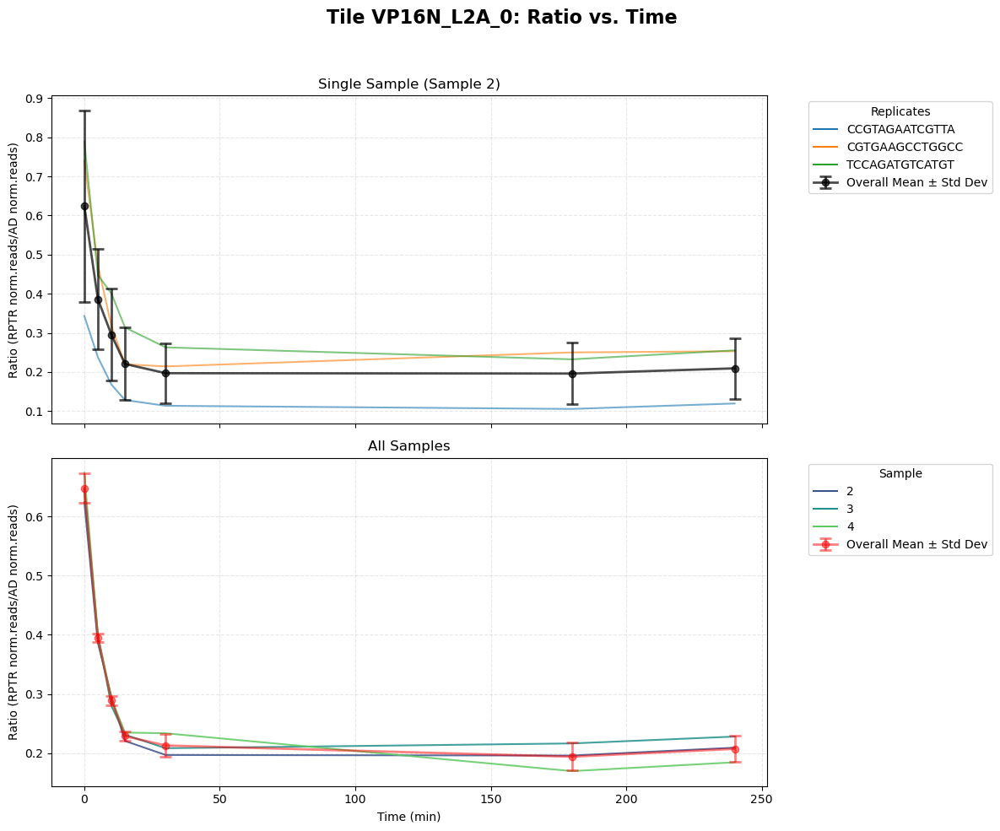

CCACCAACTGATGTTTCTGCTGGTGATGAAGCTCATGCTGATGGTGAAGATGTTGCTATGGCTCATGCTGATGCTGCTGATGACTTTGATGCTGATATGGCTGGTGATGGTGATTCTCCA
30
VP16N_7As_0


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

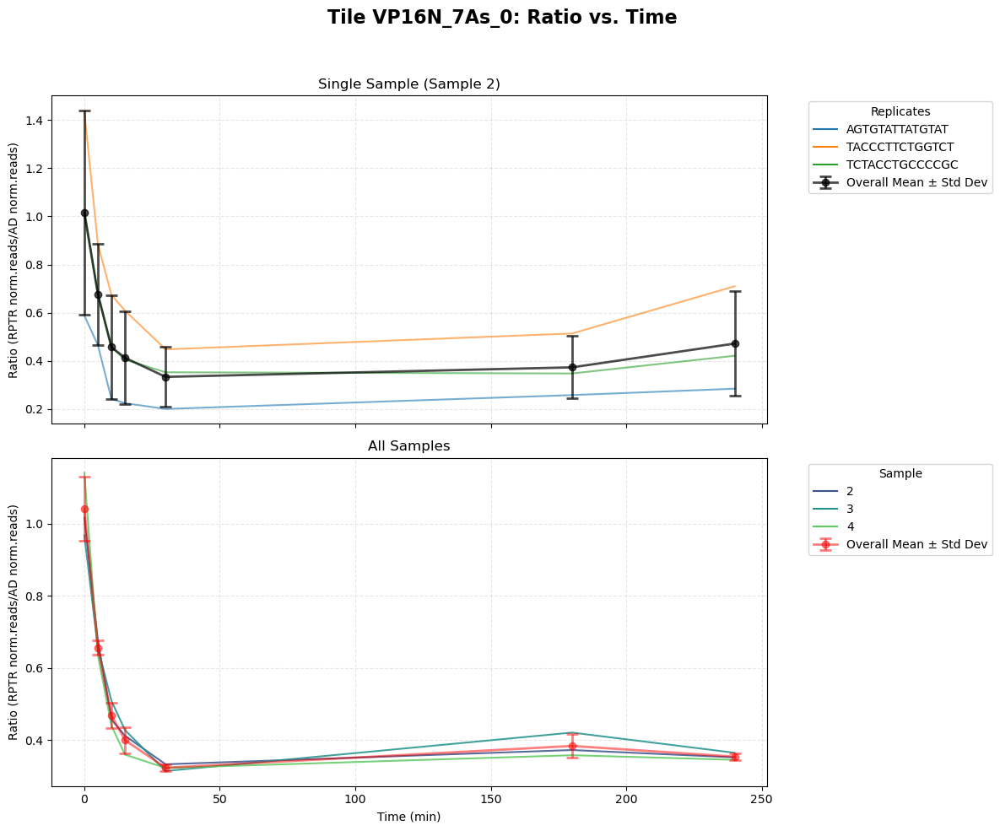

TCTACTGATTCTACTCCAATGTTTGAATATGAGAATTTGGAAGATAATATGAAAGAATGGACTTCTTTGTTTGATAATGATATTTCTGTTAATACTGATGATTTGTCTTTGGCTGATAAA
30
Gnc4Lib_Disorder_HIGH_0


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

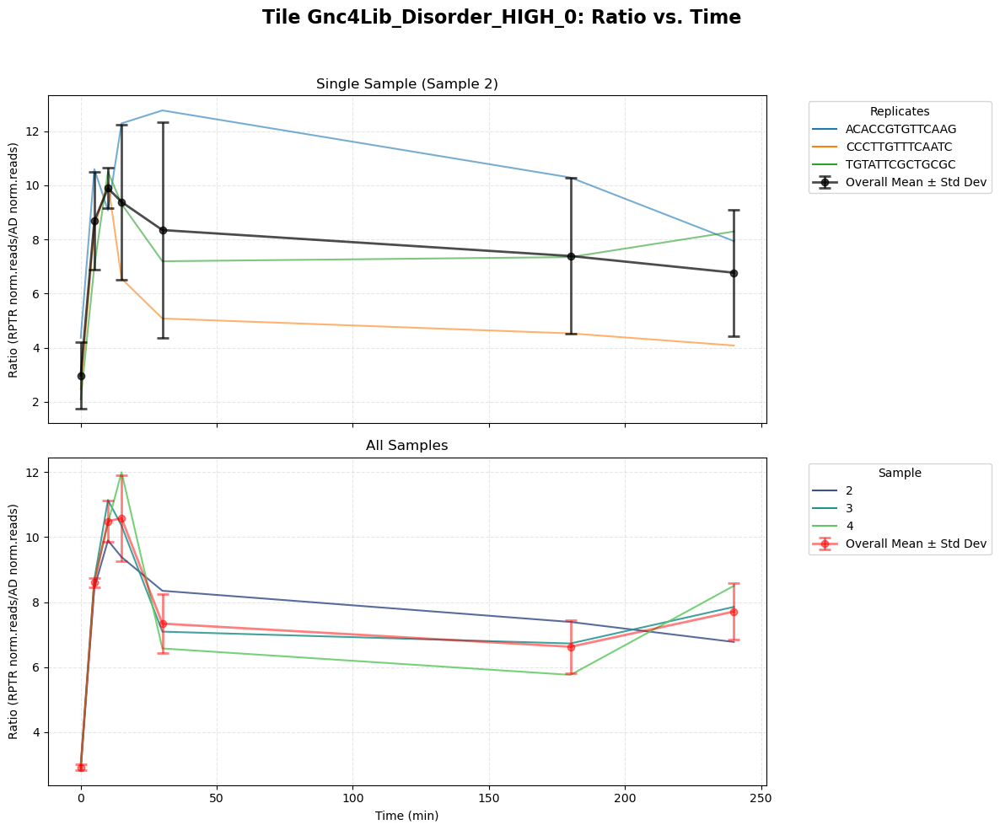

GAATCTGAAGATTCTTCTGATGAAGATAATACTTCTGATGATAAAGTTTATTCTATGTGGAATGAATTGTTTATTGATACTACTGAAGTTGCTCCATTGTCTACTAATGCTCCAATTACT
30
Gnc4Lib_Kappa_LOW_0


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

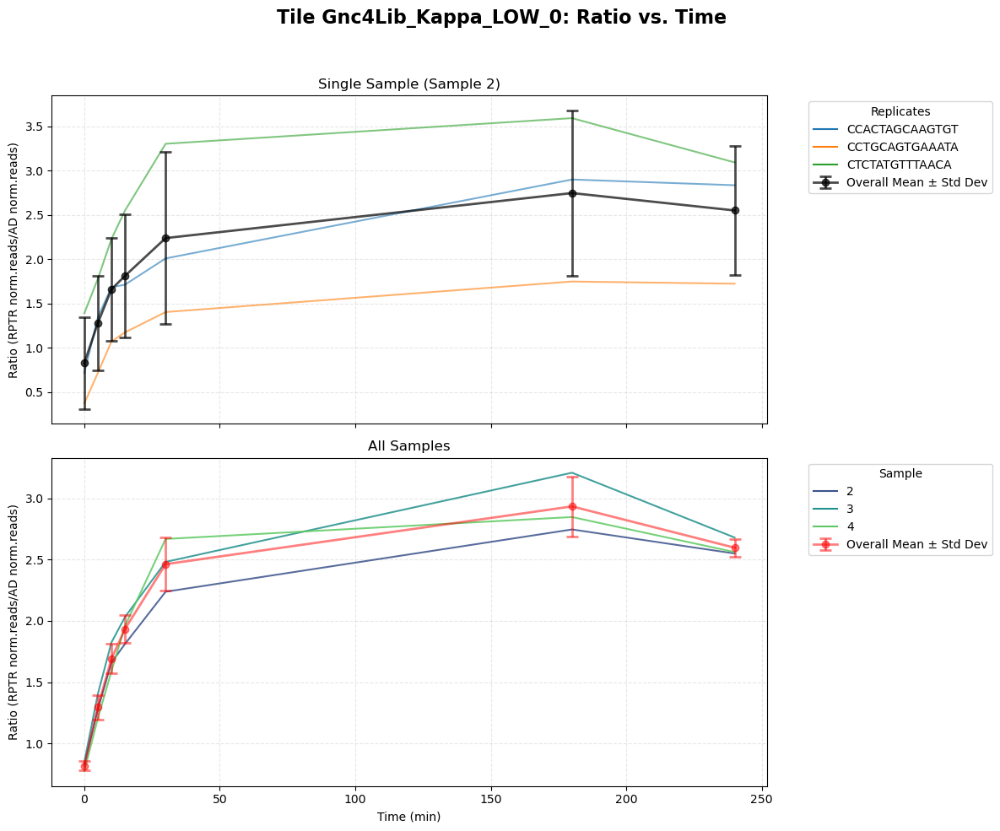

CCACCAACTGATGTTTCTTTGGGTGATGAATTGCATTTGGATGGTGAAGATGTTGCTATGGCTCATGCTGATGCTTTGGATGATGCTGATTTGGATATGTTGGGTGATGGTGATTCTCCA
30
VP16N_F442A_0


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

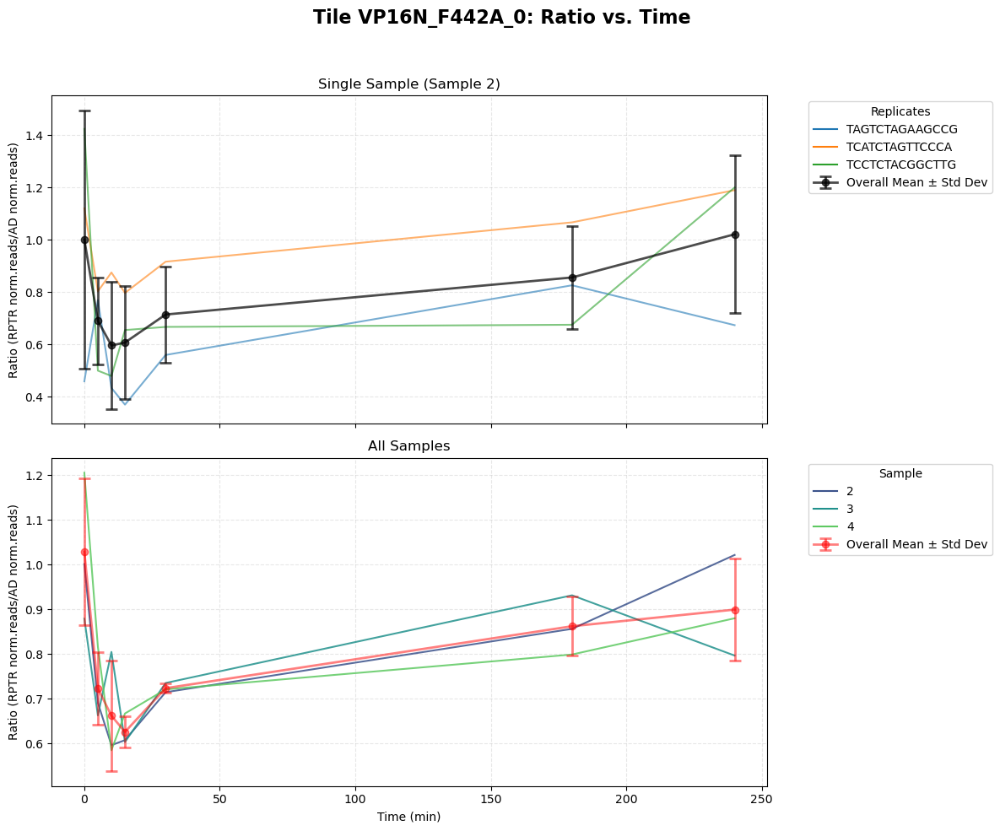

ATGACTGATTCTACTCCAATGTTTGAATATGAATTGACTGAGAATAATTCTAAAGAATGGACTTCTTTGTTTGATACTGATATTCCAGTTACTACTGATGATGAATCTTTGGCTGATAAA
30
Gnc4Lib_Disorder_HIGH_0


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

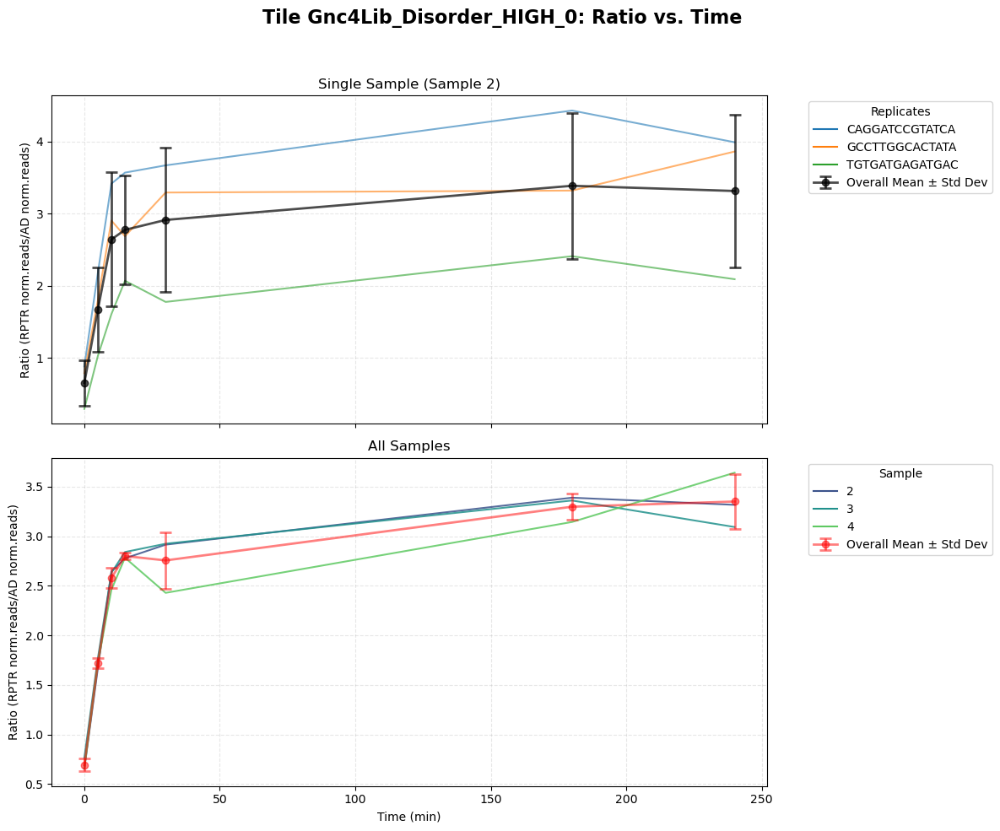

ACTGACTTTATTGATGAAGAAGTCTTGATGTCTTTGGTTATTGAAATGGGTTTGGATAGAATTAAAGAATTGCCAGAATTGTGGTTGGGTCAGAATGAATTTGACTTTATGACTGACTTT
30
CITED2_0


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

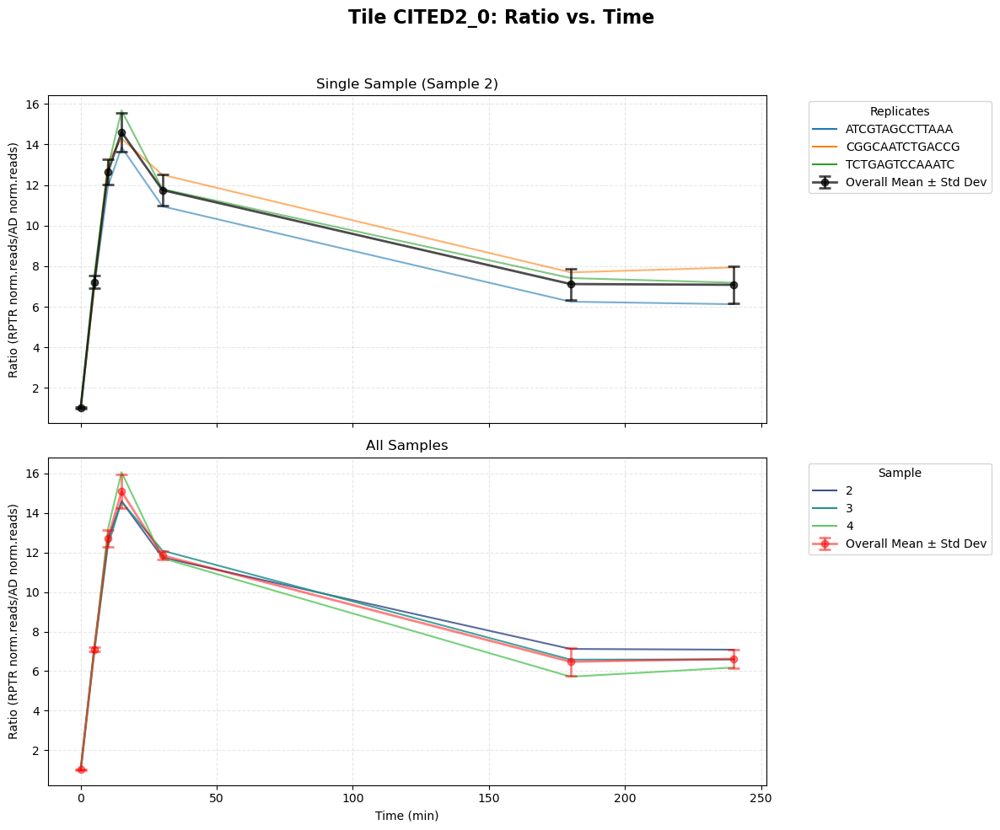

GATTCTCCAGGTCCAGGTGCTACTCCACATGATTCTGCTCCATATGGTGCTTTGGATATGGCTGATGCTGAAGCTGAACAAATGGCTACTGATGCTTTGGGTATTGATGAATATGGTGGT
30
VP16C_F2A_0


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: Fu

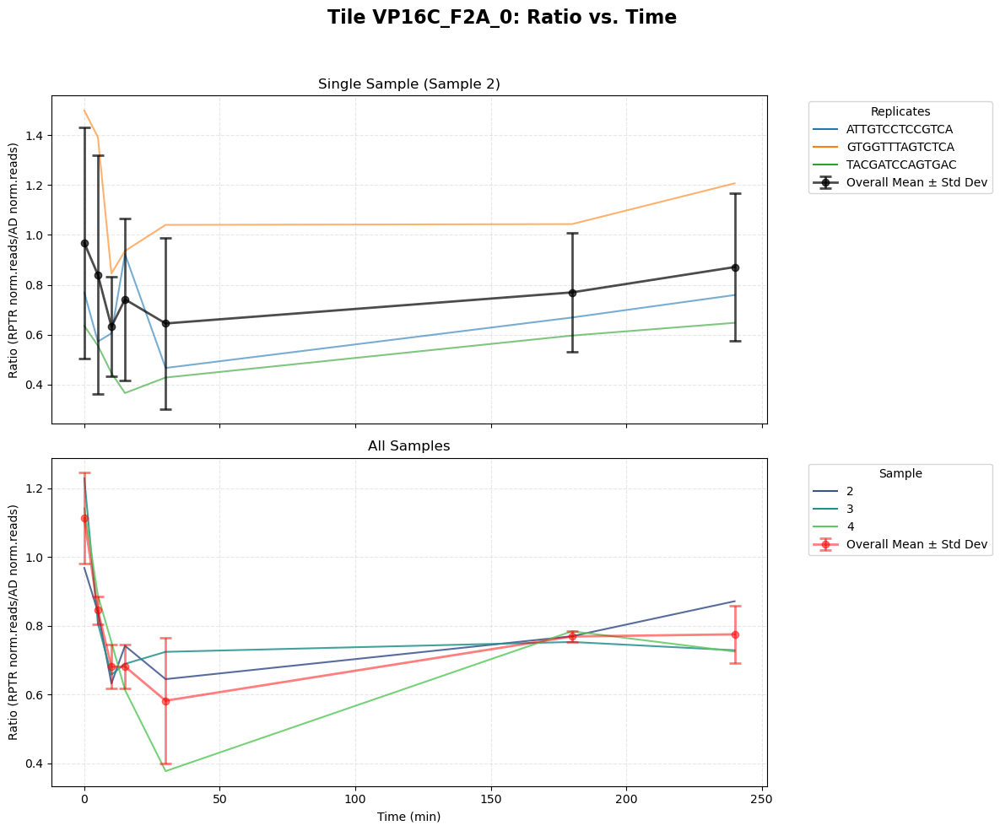

In [28]:
# Step 1: Find the top 10 tiles with the most unique rptr barcodes
top_tiles_intersect = intersectiondf_ctrl.groupby('Tile')['BCs'].nunique().reset_index()
top_tiles_sorted_intersect = top_tiles_intersect.sort_values('BCs', ascending=False)
top_10_tiles_intersect = top_tiles_sorted_intersect.head(10)['Tile']
for t in top_10_tiles_intersect.to_list():
    print(t)
    print(intersectiondf_ctrl[intersectiondf_ctrl['Tile']==t].iloc[0,12])
    tile_and_replicate_hillfxn(t)

## Clustering data

/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/matrix.py:1113: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(**tight_params)


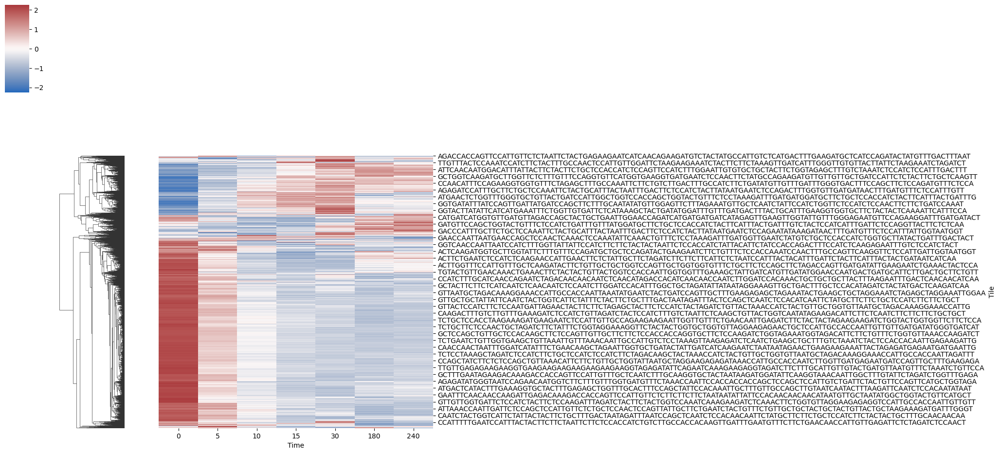

In [25]:
#Clustermap

# Step 1: Create a tile-specific DataFrame for single and multiple samples
cluster_prepdf = intersectiondf.copy(deep=True)


# Step 2: Remove outliers if required
cluster_prepdf = remove_outliers(cluster_prepdf, group_col='Time', target_col='Ratio')


# Step 3: Calculate metrics for all samples
all_sample_means = cluster_prepdf.groupby(['Tile','Time', 'sample'])['Ratio'].mean().reset_index()
# print(all_sample_means.head(3))
"""
                                                Tile  Time sample     Ratio
0  AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATG...     0      2  1.024773
1  AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATG...     0      3  0.686256
2  AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATG...     0      4  0.892634
"""
all_time_means_tocluster = all_sample_means.groupby(['Time', 'Tile'])['Ratio'].agg(['mean', 'std']).reset_index()
# print(all_time_means_tocluster.head(3))
"""
   Time                                               Tile      mean       std
0     0  AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATG...  0.867888  0.170610
1     0  AAACAAAGATCTCAACCATTGCAACCAATTATTATTGATGATATTA...  0.630991  0.076059
2     0  AAACAAATGTATATTGGTTCTAATAAACCATTGGGTAAAGATCATA...  1.224115  0.040527
"""
# Step 5: Pivot table
cluster_df = pd.pivot_table(all_time_means_tocluster, values='mean', index='Tile', columns=['Time'])
cluster_df = cluster_df.dropna(axis=0)
# print(cluster_df.head(3))
"""
Time                                                     0         5    \ etc
Tile                                                                     
AAACAAAGAGCTACTCCATTGACTCCAGTTGTTCCAGAATCTGATGA...  0.867888  0.397243   
AAACAAAGATCTCAACCATTGCAACCAATTATTATTGATGATATTAA...  0.630991  0.578451   
AAACAAATGTATATTGGTTCTAATAAACCATTGGGTAAAGATCATAG...  1.224115  0.780181  
"""
# t='TTTGTTGCTTCTCCAACATTTAATCATAAATTCTCTTCTTCTAATGCATTTACTACTGAACAAATGAAGACATTTGATCCAGAAGCTGCATTTAATGAATTGTTCTCTCCAGAGTTCTCT'
# cluster_df.loc[t,]
# Step 6: Clustermap
sns.clustermap(cluster_df, cmap="vlag",  
               col_cluster=False, 
              z_score=0)


/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/matrix.py:1113: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(**tight_params)


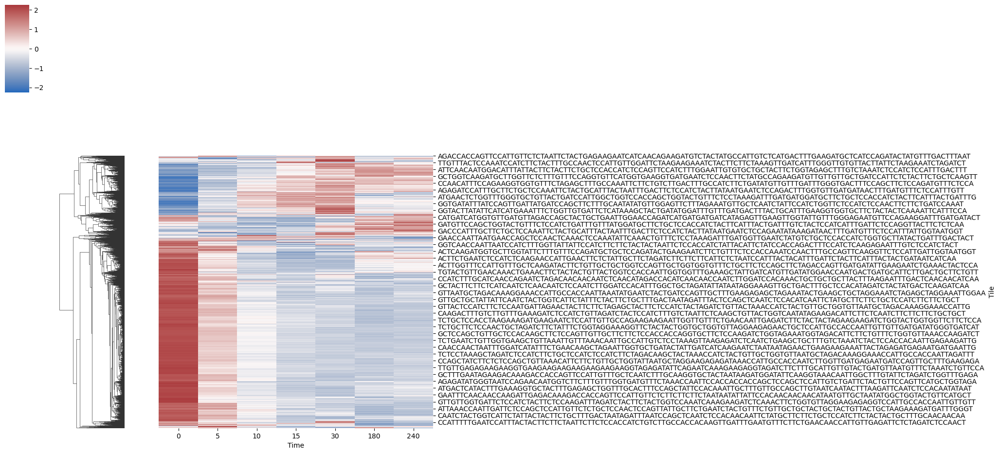

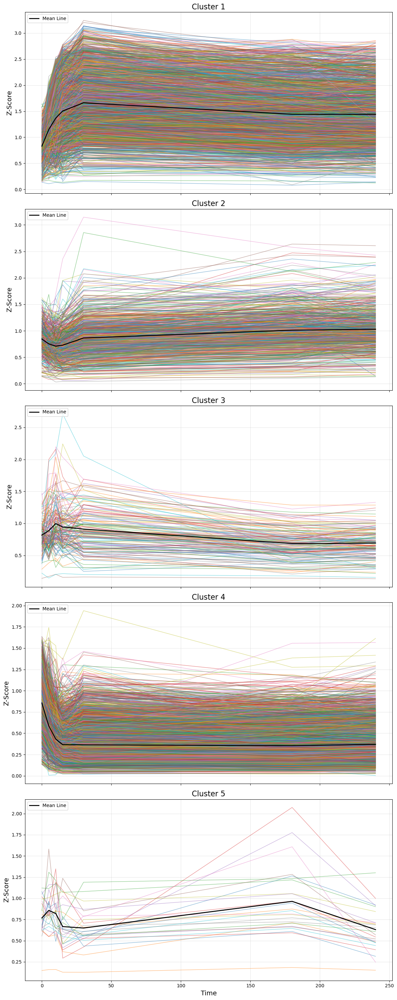

In [26]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import fcluster
import matplotlib.pyplot as plt
import seaborn as sns

# Step 6: Clustermap
clustermap = sns.clustermap(
    cluster_df, 
    cmap="vlag",  
    col_cluster=False, 
    z_score=0
)

# Step 7: Extract the linkage matrix and determine clusters
linkage_matrix = clustermap.dendrogram_row.linkage
n_clusters = 5  # Define the number of clusters (adjust as needed)
cluster_labels = fcluster(linkage_matrix, t=n_clusters, criterion='maxclust')

# Add cluster labels to the original DataFrame
cluster_df['Cluster'] = cluster_labels

# Step 8: Plot each cluster in a separate subplot
fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 6 * n_clusters), sharex=True)

# Iterate through each cluster and plot the rows
for i in range(1, n_clusters + 1):
    cluster_data = cluster_df[cluster_df['Cluster'] == i].drop('Cluster', axis=1)
    
    # Plot all rows in the cluster
    for _, row in cluster_data.iterrows():
        axes[i - 1].plot(cluster_data.columns, row.values, alpha=0.5, lw=1)
    
    # Plot the mean line for the cluster
    cluster_mean = cluster_data.mean(axis=0)
    axes[i - 1].plot(cluster_mean.index, cluster_mean.values, color="black", lw=2, label="Mean Line")
    
    # Customize subplot
    axes[i - 1].set_title(f"Cluster {i}", fontsize=16)
    axes[i - 1].set_ylabel("Z-Score", fontsize=14)
    axes[i - 1].grid(alpha=0.3)
    axes[i - 1].legend(loc="upper left")

# Customize x-axis and overall layout
axes[-1].set_xlabel("Time", fontsize=14)
plt.tight_layout()
plt.show()


### Cluster on slope

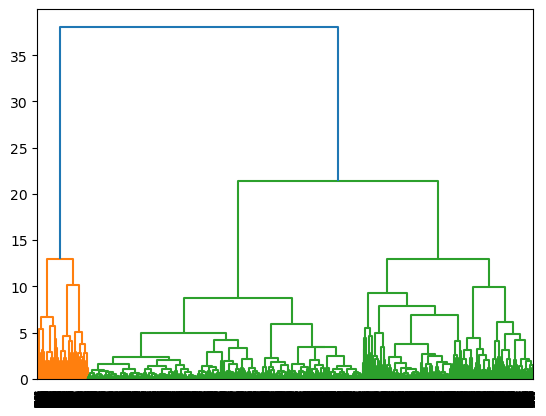

In [55]:
from scipy.cluster.hierarchy import linkage, dendrogram

diff_data = np.diff(cluster_df, axis=1)
Z = linkage(diff_data, method='ward')  # Use 'ward' or any method
dendrogram(Z)
plt.show()

In [57]:
Z

array([[2.71400000e+03, 5.35000000e+03, 4.14994219e-03, 2.00000000e+00],
       [1.83400000e+03, 7.20900000e+03, 9.59814105e-03, 2.00000000e+00],
       [4.81200000e+03, 6.01200000e+03, 1.09282402e-02, 2.00000000e+00],
       ...,
       [1.75300000e+04, 1.75310000e+04, 1.29840897e+01, 3.00700000e+03],
       [1.75290000e+04, 1.75340000e+04, 2.13475062e+01, 7.87700000e+03],
       [1.75330000e+04, 1.75350000e+04, 3.80781608e+01, 8.76900000e+03]])

/global/home/users/empchase/.local/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


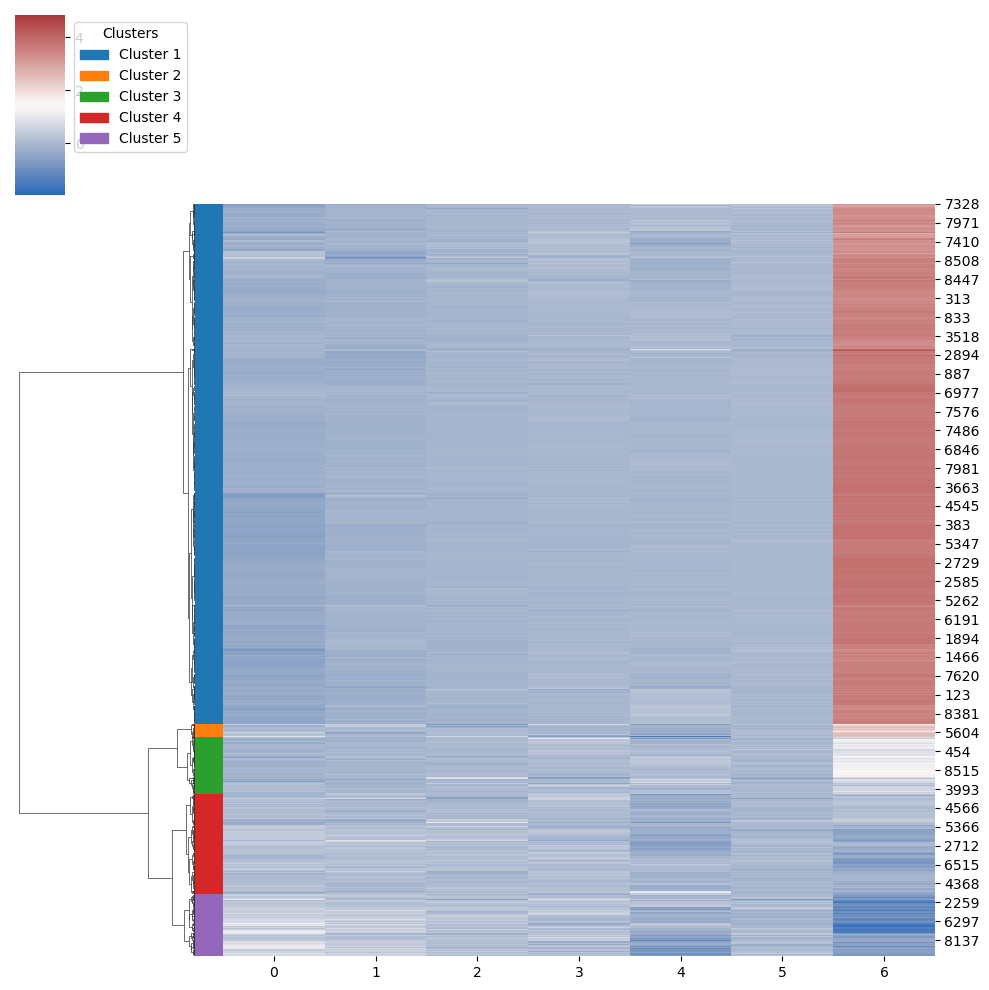

In [27]:
from scipy.cluster.hierarchy import linkage, fcluster
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

# Generate linkage matrix
diff_data = np.diff(cluster_df, axis=1)
Z = linkage(diff_data, method="ward", metric="euclidean")

# Generate cluster labels
n_clusters = 5  # Adjust the number of clusters
cluster_labels = fcluster(Z, t=n_clusters, criterion='maxclust')

# Map cluster labels to colors
cluster_palette = sns.color_palette("tab10", n_clusters)  # Use distinct colors for each cluster
cluster_colors = [cluster_palette[label - 1] for label in cluster_labels]


# Create the clustermap with row_colors
clustermap = sns.clustermap(
    diff_data,
    metric="euclidean",
    method="ward",
    row_cluster=True,
    col_cluster=False,
    row_colors=cluster_colors,
    # standard_scale=1, 
    # z_score=0,
    cmap="vlag",
)
# Create legend patches
legend_patches = [
    mpatches.Patch(color=cluster_palette[i], label=f'Cluster {i + 1}')
    for i in range(n_clusters)
]

# Add legend to the plot
plt.legend(
    handles=legend_patches,
    title="Clusters",
    bbox_to_anchor=(1.05, 1),
    loc='upper left'
)

plt.show()


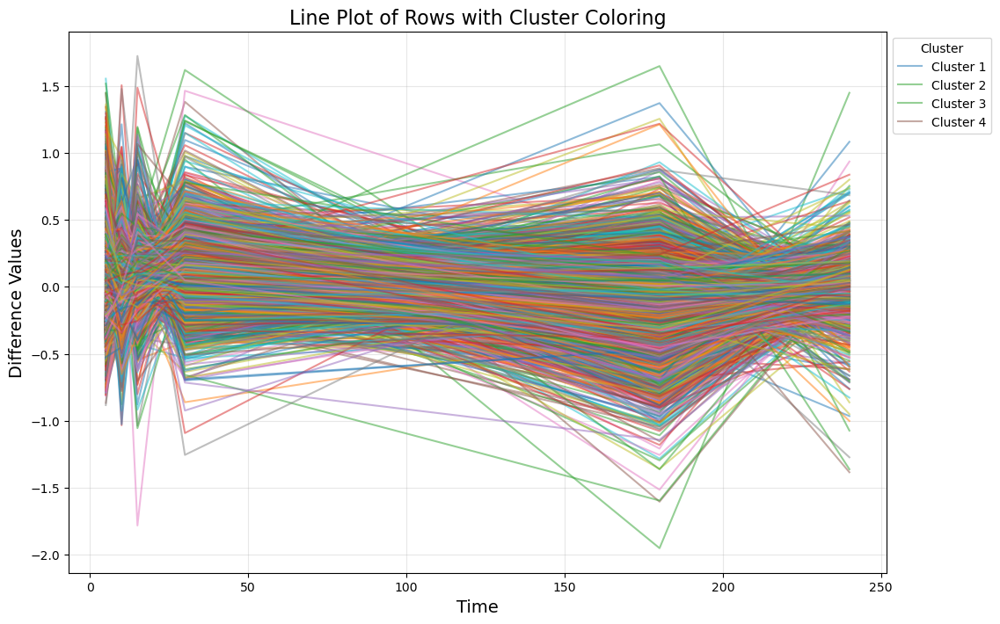

In [69]:
# Convert diff_data to DataFrame
diff_df = pd.DataFrame(diff_data, index=cluster_df.index, columns=cluster_df.columns[1:])  # Use column names from the original

# Add cluster labels
diff_df['Cluster'] = cluster_labels

# Create a line plot
plt.figure(figsize=(12, 8))

# Iterate over clusters and plot lines
for cluster in sorted(diff_df['Cluster'].unique()):
    cluster_data = diff_df[diff_df['Cluster'] == cluster].drop('Cluster', axis=1)
    for _, row in cluster_data.iterrows():
        plt.plot(cluster_data.columns, row, alpha=0.5, label=f"Cluster {cluster}" if row.name == cluster_data.index[0] else "")
        
# Customize the plot
plt.title("Line Plot of Rows with Cluster Coloring", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Difference Values", fontsize=14)
plt.legend(title="Cluster", loc="upper left", bbox_to_anchor=(1, 1))
plt.grid(alpha=0.3)
plt.show()


In [ ]:
# Convert diff_data to DataFrame
diff_df = pd.DataFrame(diff_data, index=cluster_df.index, columns=cluster_df.columns[1:])  # Use column names from the original

# Set up the number of subplots based on the number of clusters
n_clusters = diff_df['Cluster'].nunique()
fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 6 * n_clusters), sharex=True)

# Iterate through each cluster
for i, cluster in enumerate(sorted(diff_df['Cluster'].unique())):
    cluster_data = diff_df[diff_df['Cluster'] == cluster].drop('Cluster', axis=1)
    
    # Plot each row in the cluster
    for _, row in cluster_data.iterrows():
        axes[i].plot(cluster_data.columns, row, alpha=0.5, lw=1)
    
    # Plot the mean line for the cluster
    cluster_mean = cluster_data.mean(axis=0)
    axes[i].plot(cluster_mean.index, cluster_mean.values, color="black", lw=2, label="Mean Line")
    
    # Customize the subplot
    axes[i].set_title(f"Cluster {cluster}", fontsize=16)
    axes[i].set_ylabel("Difference Values", fontsize=14)
    axes[i].grid(alpha=0.3)
    axes[i].legend(loc="upper left")
    
# Customize the x-axis and overall layout
axes[-1].set_xlabel("Time", fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
cluster_data.head()

# Old stuff and Test Runs

          Feature 1  Feature 2  Feature 3  Feature 4
Sample A        0.5        1.2        3.3        4.1
Sample B        1.1        0.7        3.5        3.9
Sample C        0.9        1.0        3.7        4.3
Sample D        1.4        1.3        3.8        4.0


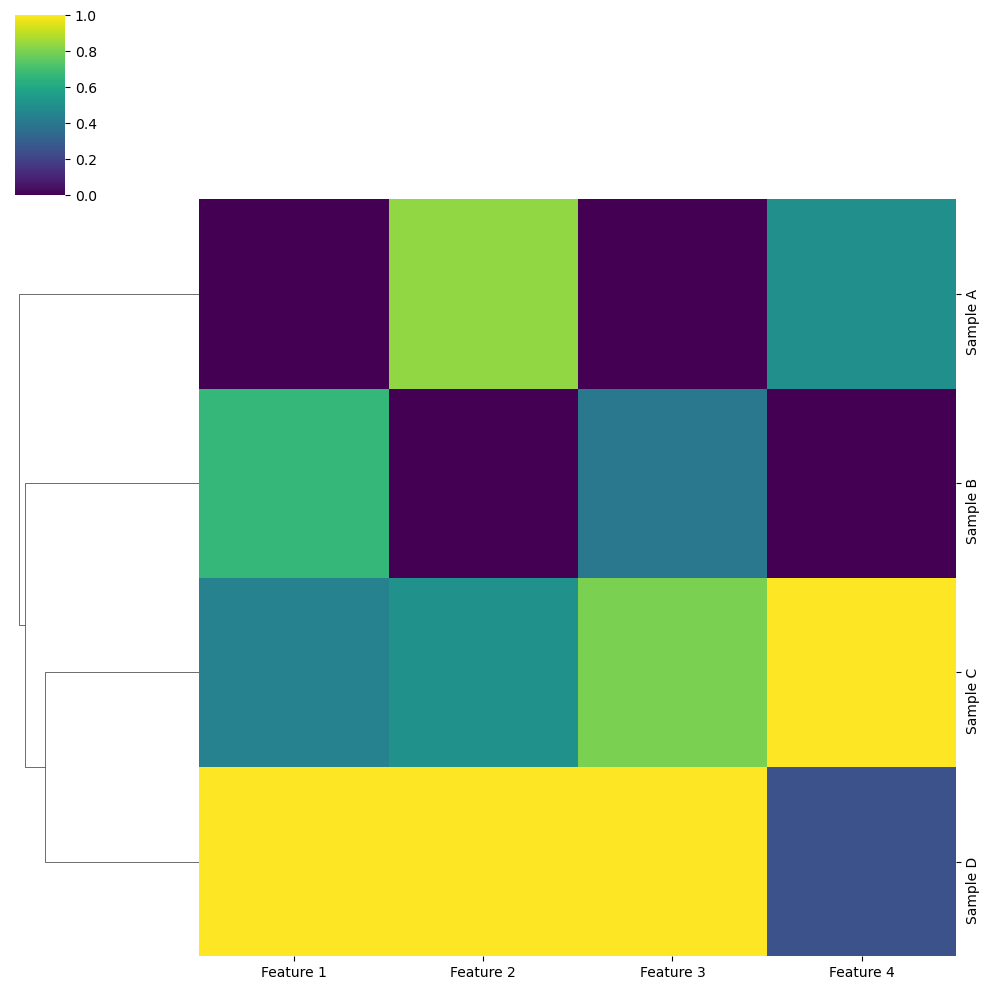

In [10]:
# Example DataFrame
gptdata = {
    "Feature 1": [0.5, 1.1, 0.9, 1.4],
    "Feature 2": [1.2, 0.7, 1.0, 1.3],
    "Feature 3": [3.3, 3.5, 3.7, 3.8],
    "Feature 4": [4.1, 3.9, 4.3, 4.0],
}
gptdf = pd.DataFrame(gptdata, index=["Sample A", "Sample B", "Sample C", "Sample D"], )

print(gptdf)

# Create a cluster map
sns.clustermap(gptdf, cmap="viridis", standard_scale=1, col_cluster=False)
plt.show()

In [16]:
# Tile 5 in top ten in Ciberseq2_iii_Gcn3-Copy.ipynb
tile5_seq = 'TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTGTTCCACCATCTACTTCTTTGACTAATTTGACTACTCCAGGTTCTACTTATTTGGATACTCCAGATGATTCATTT'
tile5 = concatenated_df.copy(deep=True)
tile5 = tile5[tile5['Tile']==tile5_seq]
tile5['Time'] = tile5['Library_a'].str.split('_').str[-1]
tile5['sample'] = tile5['Library_a'].str.split('_').str[-2]
tile5.head()

,BCs,count_r,Allreads_r,Tile-AD,count_a,Library_a,Allreads_a,R_normalized,A_normalized,Ratio,Tile,AD,Time,sample
674,TTACGTTAAAGAAA,5057,23971211,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,4294,AD_3_30,32851735,0.000211,0.000131,1.613984,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,TACAAAGGGAC,30,3
1880,TGAAACAAACAGTG,1975,23971211,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,1635,AD_3_30,32851735,0.000082,0.000050,1.655456,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,TTGCTCCGAGG,30,3
2574,TCCAACCCTCGTGC,1381,23971211,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,1338,AD_3_30,32851735,0.000058,0.000041,1.414510,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,GTCTGCAGTTG,30,3
7401,GTCAGAAAAAGACT,300,23971211,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,110,AD_3_30,32851735,0.000013,0.000003,3.737635,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,TTATAAATTAT,30,3
8973,TCCCCCGCAGCTGT,200,23971211,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,230,AD_3_30,32851735,0.000008,0.000007,1.191710,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,CGCTCCCTCCT,30,3


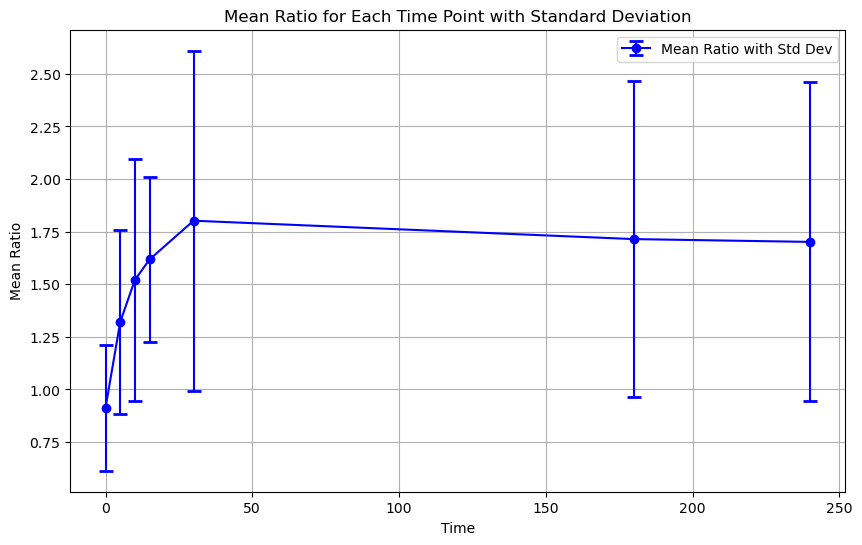

In [41]:
tile5['Time'] = pd.to_numeric(tile5['Time'])
# Group by 'Time' and calculate mean and standard deviation of 'Ratio'
time_stats = tile5.groupby('Time')['Ratio'].agg(['mean', 'std']).reset_index()

# Plotting
plt.figure(figsize=(10, 6))
plt.errorbar(time_stats['Time'], time_stats['mean'], yerr=time_stats['std'], 
             fmt='o-', capsize=5, capthick=2, color='b', label='Mean Ratio with Std Dev')

# Adding labels and title
plt.xlabel('Time')
plt.ylabel('Mean Ratio')
plt.title('Mean Ratio for Each Time Point with Standard Deviation')
plt.legend()
plt.grid(True)
plt.show()

/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024.02-1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024.02-1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024.02-1/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_d

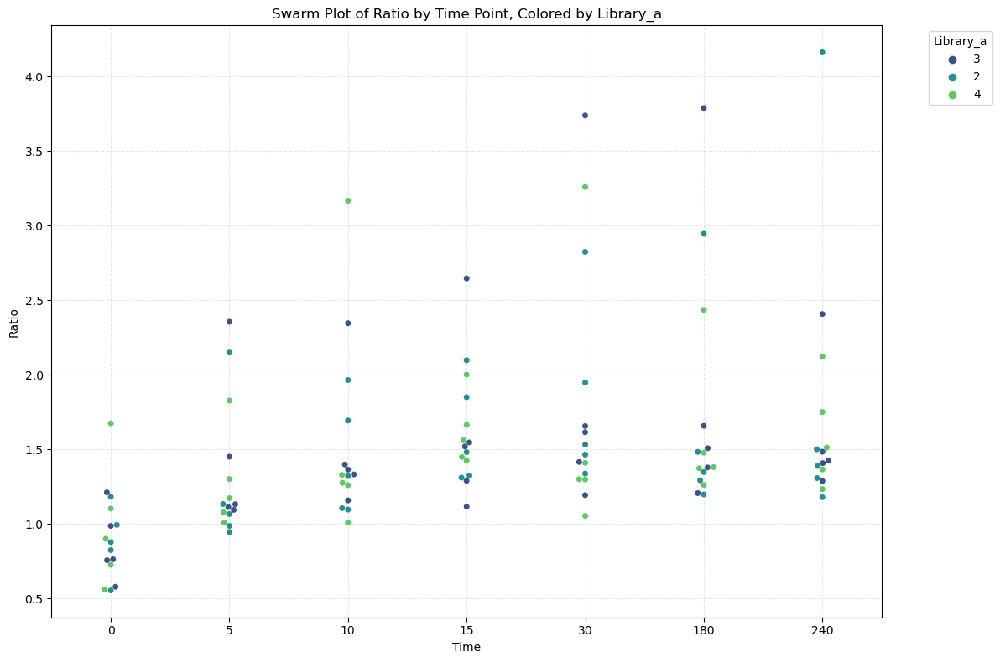

In [18]:

# Set up the figure size
plt.figure(figsize=(12, 8))

# Create the swarm plot
sns.swarmplot(data=tile5, x='Time', y='Ratio', hue='sample', palette='viridis')

# Customize plot
plt.xlabel('Time')
plt.ylabel('Ratio')
plt.title('Swarm Plot of Ratio by Time Point, Colored by Library_a')
plt.legend(title='Library_a', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)  # Optional: to add a faint grid

# Show plot
plt.tight_layout()
plt.show()


In [19]:
tile5.describe()

,count_r,Allreads_r,count_a,Allreads_a,R_normalized,A_normalized,Ratio,Time
count,105.000000,1.050000e+02,105.000000,1.050000e+02,105.000000,105.000000,105.000000,105.000000
mean,1747.057143,2.717471e+07,1513.409524,3.009832e+07,0.000064,0.000050,1.512613,68.571429
std,1834.548927,2.166411e+06,1555.652879,1.795253e+06,0.000066,0.000051,0.652754,91.726795
min,132.000000,2.380298e+07,103.000000,2.642397e+07,0.000005,0.000003,0.553041,0.000000
25%,316.000000,2.601378e+07,189.000000,2.913057e+07,0.000012,0.000006,1.156836,5.000000
50%,1358.000000,2.692946e+07,1222.000000,3.001938e+07,0.000051,0.000041,1.363823,15.000000
75%,2112.000000,2.925249e+07,1759.000000,3.144002e+07,0.000080,0.000057,1.613984,180.000000
max,6859.000000,3.076922e+07,5358.000000,3.297164e+07,0.000233,0.000171,4.160888,240.000000


In [32]:
# testQ1 = tile5.describe().iloc[4,6]
# testQ3 = tile5.describe().iloc[6,6]
# testIQR = 1.5*(testQ3 - testQ1)
# # tile5[tile5['Ratio']>(testQ3+testIQR)]
# # tile5[tile5['Ratio']<(testQ1-testIQR)]
# tile5[(tile5['Ratio']<(testQ3+testIQR))&(tile5['Ratio']>(testQ1-testIQR))]

#but i need outlier for each time point...

/tmp/ipykernel_290561/4253052407.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby(group_col, group_keys=False).apply(filter_outliers)


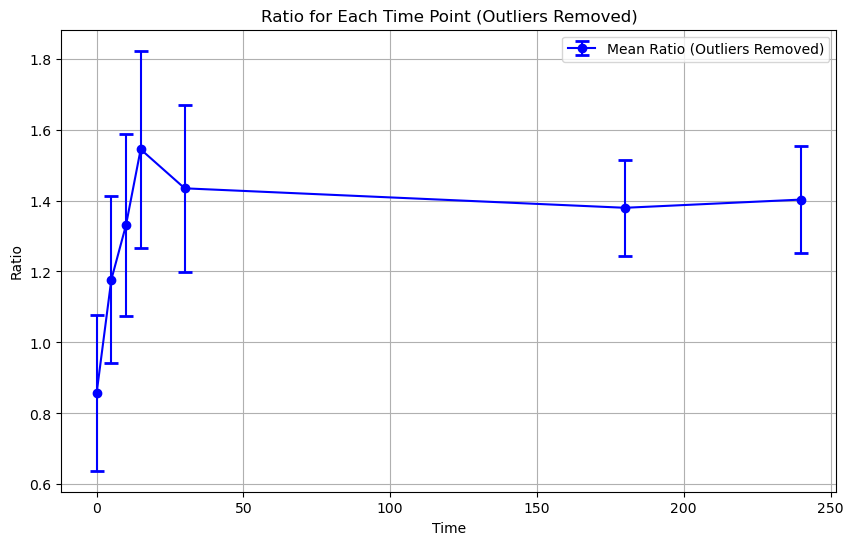

In [42]:
# Define a function to remove outliers using the IQR method
def remove_outliers(df, group_col, target_col):
    def filter_outliers(group):
        q1 = group[target_col].quantile(0.25)
        q3 = group[target_col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        return group[(group[target_col] >= lower_bound) & (group[target_col] <= upper_bound)]
    
    return df.groupby(group_col, group_keys=False).apply(filter_outliers)

#definie time column
tile5['Time'] = pd.to_numeric(tile5['Time'])

# Remove outliers for each time point
df_no_outliers = remove_outliers(tile5, group_col='Time', target_col='Ratio')

# Calculate mean and standard deviation for the cleaned data
time_stats_cleaned = df_no_outliers.groupby('Time')['Ratio'].agg(['mean', 'std']).reset_index()

# Replot mean with standard deviation error bars
plt.figure(figsize=(10, 6))
plt.errorbar(time_stats_cleaned['Time'], time_stats_cleaned['mean'], yerr=time_stats_cleaned['std'], 
             fmt='o-', capsize=5, capthick=2, color='b', label='Mean Ratio (Outliers Removed)')

# # Overlay the swarm plot for individual data points
# sns.swarmplot(data=df_no_outliers, x='Time', y='Ratio', hue='Library_a', 
#               palette='viridis', dodge=True, alpha=0.7)

# Add labels and title
plt.xlabel('Time')
plt.ylabel('Ratio')
plt.title('Ratio for Each Time Point (Outliers Removed)')
plt.legend()
plt.grid(True)
plt.show()


/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024.02-1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024.02-1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024.02-1/lib/python3.11/site-packages/seaborn/categorical.py:3544: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024

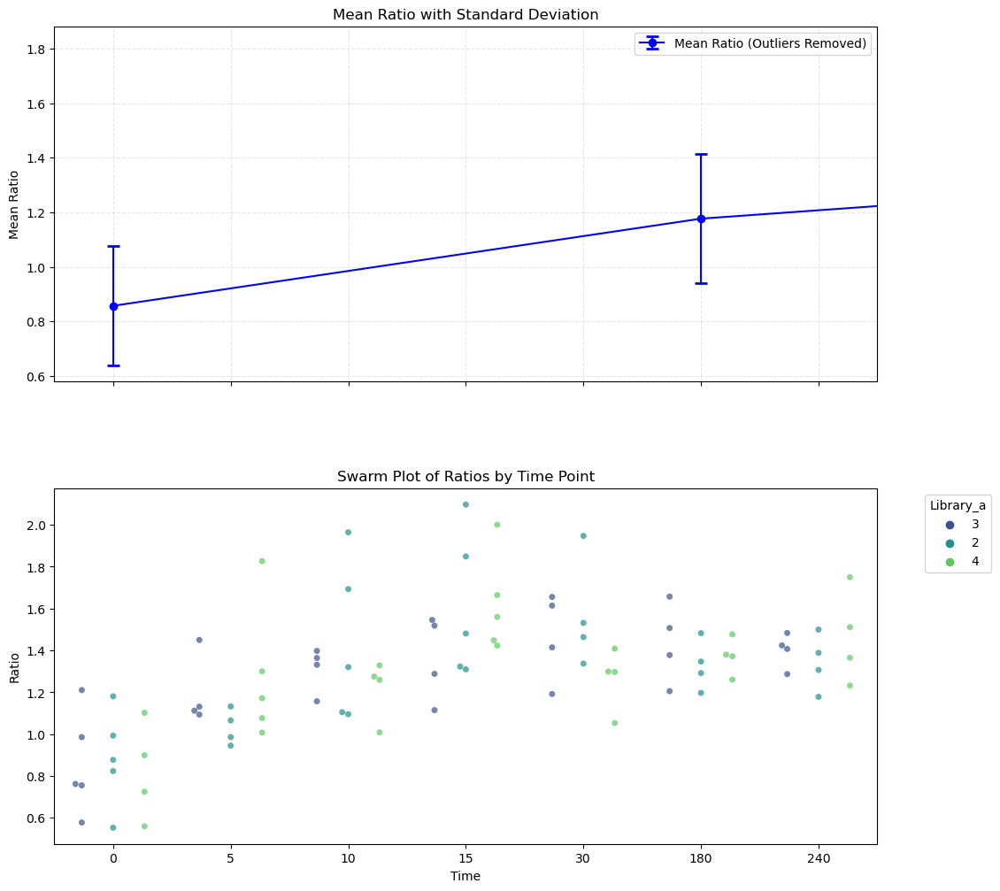

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the figure and subplots
fig, axes = plt.subplots(2, 1, figsize=(12, 12), sharex=True, gridspec_kw={'hspace': 0.3})

# Plot 1: Mean Ratios with Error Bars
axes[0].errorbar(time_stats_cleaned['Time'], time_stats_cleaned['mean'], yerr=time_stats_cleaned['std'], 
                 fmt='o-', capsize=5, capthick=2, color='b', label='Mean Ratio (Outliers Removed)')
axes[0].set_title('Mean Ratio with Standard Deviation')
axes[0].set_ylabel('Mean Ratio')
axes[0].grid(True, linestyle='--', alpha=0.3)
axes[0].legend()

# Plot 2: Individual Points with Swarm Plot
sns.swarmplot(data=df_no_outliers, x='Time', y='Ratio', hue='sample', 
              palette='viridis', dodge=True, alpha=0.7, ax=axes[1])
axes[1].set_title('Swarm Plot of Ratios by Time Point')
axes[1].set_xlabel('Time')
axes[1].set_ylabel('Ratio')
axes[1].legend(title='Library_a', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()


/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024.02-1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024.02-1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024.02-1/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_d

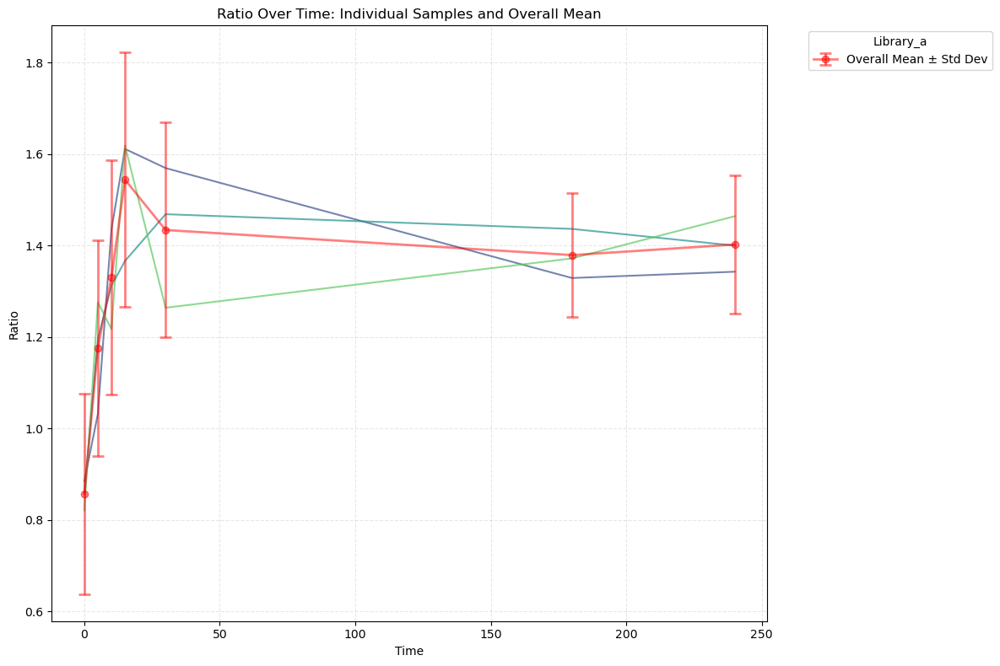

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Calculate the mean ratio for each Time point and Library_a
sample_means = df_no_outliers.groupby(['Time', 'sample'])['Ratio'].mean().reset_index()

# Step 2: Plot individual sample lines
plt.figure(figsize=(12, 8))
sns.lineplot(data=sample_means, x='Time', y='Ratio', hue='sample', 
             palette='viridis', alpha=0.7, lw=1.5, legend=False)  # Use lighter lines for samples

# Step 3: Overlay the overall mean with error bars
plt.errorbar(time_stats_cleaned['Time'], time_stats_cleaned['mean'], yerr=time_stats_cleaned['std'],
             fmt='o-', capsize=5, capthick=2, color='red', label='Overall Mean ± Std Dev', lw=2, alpha=0.5)

# Customize plot
plt.xlabel('Time')
plt.ylabel('Ratio')
plt.title('Ratio Over Time: Individual Samples and Overall Mean')
plt.legend(title='Library_a', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)  # Optional: Faint grid

# Show plot
plt.tight_layout()
plt.show()


/tmp/ipykernel_290561/1208077572.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby(group_col, group_keys=False).apply(filter_outliers)
/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024.02-1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024.02-1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Conve

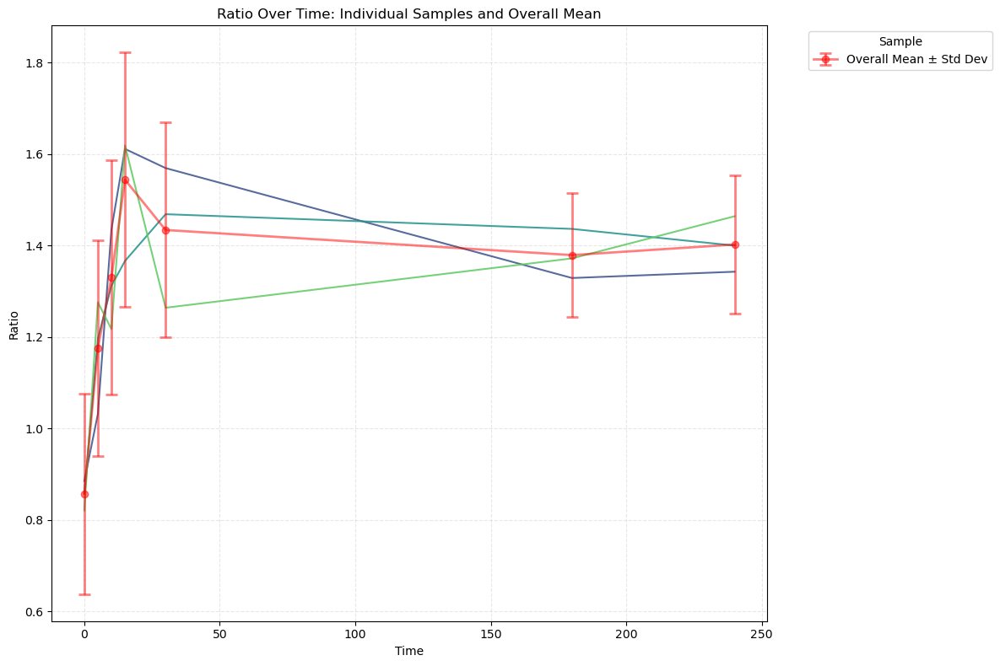

In [52]:
tile_hillfxn(tile5_seq)

In [35]:
tile5

,BCs,count_r,Allreads_r,Tile-AD,count_a,Library_a,Allreads_a,R_normalized,A_normalized,Ratio,Tile,AD,Time,sample
674,TTACGTTAAAGAAA,5057,23971211,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,4294,AD_3_30,32851735,0.000211,0.000131,1.613984,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,TACAAAGGGAC,30,3
1880,TGAAACAAACAGTG,1975,23971211,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,1635,AD_3_30,32851735,0.000082,0.000050,1.655456,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,TTGCTCCGAGG,30,3
2574,TCCAACCCTCGTGC,1381,23971211,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,1338,AD_3_30,32851735,0.000058,0.000041,1.414510,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,GTCTGCAGTTG,30,3
7401,GTCAGAAAAAGACT,300,23971211,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,110,AD_3_30,32851735,0.000013,0.000003,3.737635,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,TTATAAATTAT,30,3
8973,TCCCCCGCAGCTGT,200,23971211,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,230,AD_3_30,32851735,0.000008,0.000007,1.191710,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,CGCTCCCTCCT,30,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
296447,TTACGTTAAAGAAA,6390,29404000,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,4699,AD_2_180,27927346,0.000217,0.000168,1.291572,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,TACAAAGGGAC,180,2
297693,TGAAACAAACAGTG,2382,29404000,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,1680,AD_2_180,27927346,0.000081,0.000060,1.346653,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,TTGCTCCGAGG,180,2
298292,TCCAACCCTCGTGC,1738,29404000,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,1379,AD_2_180,27927346,0.000059,0.000049,1.197040,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,GTCTGCAGTTG,180,2
301327,GTCAGAAAAAGACT,589,29404000,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,190,AD_2_180,27927346,0.000020,0.000007,2.944320,TTGGGTCCAACTGTTTCTCCTAAAGATATCTTTAATATTGATTCTG...,TTATAAATTAT,180,2


In [29]:
tile5[tile5['Ratio']>2][['BCs','count_r', 'Allreads_r','count_a','Allreads_a', 'Ratio']]

,BCs,count_r,Allreads_r,count_a,Allreads_a,Ratio
7401,GTCAGAAAAAGACT,300,23971211,110,32851735,3.737635
20452,GTCAGAAAAAGACT,580,29412940,149,31440015,4.160888
51212,GTCAGAAAAAGACT,437,29744940,181,29647093,2.406423
64636,GTCAGAAAAAGACT,581,29401118,292,31347777,2.121467
95824,GTCAGAAAAAGACT,397,29252494,154,30019375,2.645505
112256,GTCAGAAAAAGACT,364,29137393,159,29965104,2.354341
125670,GTCAGAAAAAGACT,335,26148358,178,29130572,2.096667
156004,GTCAGAAAAAGACT,330,26929465,145,27745616,2.344837
185142,GTCAGAAAAAGACT,324,27169803,109,29782961,3.258366
201355,GTCAGAAAAAGACT,316,26013783,178,31477987,2.148179


In [28]:
tile5[['BCs','count_r', 'Allreads_r','count_a','Allreads_a', 'Ratio']].describe()

,count_r,Allreads_r,count_a,Allreads_a,Ratio
count,105.000000,1.050000e+02,105.000000,1.050000e+02,105.000000
mean,1747.057143,2.717471e+07,1513.409524,3.009832e+07,1.512613
std,1834.548927,2.166411e+06,1555.652879,1.795253e+06,0.652754
min,132.000000,2.380298e+07,103.000000,2.642397e+07,0.553041
25%,316.000000,2.601378e+07,189.000000,2.913057e+07,1.156836
50%,1358.000000,2.692946e+07,1222.000000,3.001938e+07,1.363823
75%,2112.000000,2.925249e+07,1759.000000,3.144002e+07,1.613984
max,6859.000000,3.076922e+07,5358.000000,3.297164e+07,4.160888
